## Import Packages

In [61]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) 

import pandas as pd
import random
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

import os

import numpy as np
import torch.nn.functional as F
import networkx as nx
import matplotlib.image as mpimg
from torch.nn import Linear
from torchvision.utils import make_grid

from google.colab import drive
drive.mount('/content/drive')

from sklearn.metrics import accuracy_score
from datetime import datetime
from IPython.display import clear_output 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [62]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-cluster -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

1.12.1+cu113


In [63]:
import torch_geometric
from torch_geometric.datasets import TUDataset
from torch_geometric.data import DataLoader, Batch, Data 
from torch_geometric.nn import GraphConv, GCNConv, TopKPooling
from torch_geometric.nn import global_mean_pool as gap, global_max_pool as gmp

import torch_geometric.utils as utils
from torch_geometric.utils import from_networkx, degree

import torch_geometric.transforms as T

from torch_geometric.nn import global_sort_pool, global_add_pool,global_mean_pool,global_max_pool

## Import the AD dataset

In [64]:
train_dataset=[]
graphlist=[]
import networkx as nx
import torch_geometric
from torch_geometric.data import Data, Dataset
from torch_geometric.loader import DataLoader
from torch_geometric.utils import erdos_renyi_graph, to_networkx, from_networkx

%cd /content/drive/MyDrive/ALL_NETWORKS

train_dataset=[]
test_dataset=[]
graphlist=[]
for i in range(1, 200):
    if os.path.isfile('AD_'+'{0:0>3}'.format(i)+'.csv'):
      tmp=pd.read_csv('AD_'+'{0:0>3}'.format(i)+'.csv', header=None)
      nxG = nx.Graph(tmp.values)
      nxG.remove_nodes_from(list(nx.isolates(nxG)))
      tmp=(tmp.to_numpy())
      tmp=torch.from_numpy(tmp)  
      tmp=torch.div(tmp,tmp.max())
      G = nx.from_numpy_matrix(np.array(tmp))
      strength = G.degree(weight='weight')
      x = []
      for i in strength:
        x.extend([i[1]])
      x = np.array(x).reshape(90,1)
      pygG = from_networkx(nxG)
      #pygG.x=degree(pygG.edge_index[0])
      pygG.x = torch.FloatTensor(x)
      #pygG.x=torch.ones(len(nxG)).type(torch.float)
      pygG.x = pygG.x.view(-1, 1)
      tmp=pygG.weight
      tmp=torch.div(tmp,tmp.max())
      pygG.edge_attr=tmp
      pygG.y=torch.ones(1).type(torch.float)
      graphlist.append(pygG)

for i in range(1, 200):
    if os.path.isfile('CN_'+'{0:0>3}'.format(i)+'.csv'):
      tmp=pd.read_csv('CN_'+'{0:0>3}'.format(i)+'.csv', header=None)
      nxG = nx.Graph(tmp.values)
      nxG.remove_nodes_from(list(nx.isolates(nxG)))
      tmp=(tmp.to_numpy())
      tmp=torch.from_numpy(tmp)  
      tmp=torch.div(tmp,tmp.max())
      G = nx.from_numpy_matrix(np.array(tmp))
      strength = G.degree(weight='weight')
      x = []
      for i in strength:
        x.extend([i[1]])
      x = np.array(x).reshape(90,1)
      pygG = from_networkx(nxG)
      #pygG.x=degree(pygG.edge_index[0])
      pygG.x = torch.FloatTensor(x)
      #ygG.x=torch.ones(len(nxG)).type(torch.float)
      pygG.x = pygG.x.view(-1, 1)
      tmp=pygG.weight
      tmp=torch.div(tmp,tmp.max())
      pygG.edge_attr=tmp
      pygG.y=torch.zeros(1).type(torch.float)
      graphlist.append(pygG)


/content/drive/.shortcut-targets-by-id/10M6M6of9sCS0_CWq5d9EF6LhBCK9klNf/ALL_NETWORKS


## Import the coordinates of the brain nodes

In [65]:
%cd /content/drive/MyDrive
pos = pd.read_csv("node_aal90.csv", header = None)

position1 = []
for i in pos[0]:
  position1.extend([i])
position1 = np.array(position1).reshape(90,1)

position2 = []
for i in pos[1]:
  position2.extend([i])
position2 = np.array(position2).reshape(90,1)

position3 = []
for i in pos[2]:
  position3.extend([i])
position3 = np.array(position3).reshape(90,1)

position = np.concatenate((position1, position2, position3), axis = 1) 

for i in range(len(graphlist)):
  graphlist[i].x = torch.FloatTensor(np.concatenate((graphlist[i].x, position), axis = 1))

/content/drive/MyDrive


In [66]:
dataset = random.sample(graphlist, len(graphlist))
n = len(graphlist) // 5
test_dataset = dataset[:n]
train_dataset = dataset[n:]
test_dataloader = DataLoader(test_dataset, batch_size=16)
train_loader = DataLoader(train_dataset, batch_size=16)

In [67]:
def graph_to_adj(example):
    adj=torch.zeros(90,90).to(device)
    row, col = example.edge_index
    adj[row, col]=example.edge_attr
    adj[col, row]=example.edge_attr
    adj = adj.detach().cpu()
    return adj

## Define the generator of the GAN


In [68]:
def get_noise(n_samples,classes,noise_dim):
    noise = torch.rand(n_samples,noise_dim)
    noise = torch.cat((noise.cuda(),classes.view(n_samples,-1)),1)
    return noise

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.lin1 = nn.Linear(91,1335)
        self.lin2 = nn.Linear(1335,2670)
        self.lin3 = nn.Linear(2670,4005)
        self.relu = nn.LeakyReLU(0.2)   
        self.sig = nn.Sigmoid()
        self.dropout = nn.Dropout(p=0.5)
        self.tanh = nn.Tanh()

    def forward(self, noise):
        
        noise = self.lin1(noise)
        noise = self.relu(noise)
        noise = self.lin2(noise)
        noise = self.relu(noise)
        noise = self.lin3(noise)
        #
        noise = self.sig(noise)
        #noise = self.dropout(noise)
        #noise = self.tanh(noise)
        #
        return  noise

def mlp_to_graph_batch(mlp_output, n_samples):
  mlp_output=mlp_output.cuda()
  n_samples=n_samples.cuda()
  datalist=[]
  for i in range(n_samples):
    adj=torch.zeros(90,90).to(device)
    adj[torch.triu(torch.ones(90,90)) != 1] = mlp_output[i]
    adj_t=adj.t()
    adj[torch.tril(torch.ones(90,90)) != 1] = adj_t[torch.tril(torch.ones(90,90)) != 1]
    x=torch.ones(90,4).type(torch.float)
    edge_index = (adj>0.001).nonzero().t()
    row, col = edge_index
    edge_weight = adj[row, col]
    dataformat=Data(x=x, edge_index=edge_index, edge_attr=edge_weight)
    datalist.append(dataformat)
  batchlist=Batch.from_data_list(datalist)
  return batchlist


## Define the Discriminator and Classifier of the GAN

In [69]:

class D_Net_FC(torch.nn.Module):
    def __init__(self):
        super(D_Net_FC, self).__init__()
        self.conv1 = GraphConv(4, 128)
        self.conv2 = GraphConv(128, 128)
        self.conv3 = GraphConv(128, 128)
        self.N2G = torch.nn.Conv2d(128,256,(90,1))   ## node to graph convolution
        self.lin1 = torch.nn.Linear(256, 128)
        self.lin2 = torch.nn.Linear(128, 64)
        self.dis = torch.nn.Linear(64, 1)
        self.aux = torch.nn.Linear(64, 1)
        

    def forward(self, data):
        x, edge_index, edge_weight, batch = data.x, data.edge_index, data.edge_attr, data.batch
        x = F.relu(self.conv1(x, edge_index, edge_weight))
        x = F.relu(self.conv2(x, edge_index, edge_weight))
        x = F.relu(self.conv3(x, edge_index, edge_weight))
        n_samples=int(x.size(0)/90)
        x = x.view(n_samples,128,90,1 )
        x = F.relu(self.N2G(x))
        x = x.view(x.size(0), -1)
        x = F.relu(self.lin1(x)) 
        x = F.relu(self.lin2(x)) 
        disc = (self.dis(x)) 
        return disc



class C_Net_FC(torch.nn.Module):
    def __init__(self):
        super(C_Net_FC, self).__init__()
        self.conv1 = GraphConv(4, 128)
        self.conv2 = GraphConv(128, 128)
        self.conv3 = GraphConv(128, 128)
        self.N2G = torch.nn.Conv2d(128,256,(90,1))   ## node to graph convolution
        self.lin1 = torch.nn.Linear(256, 128)
        self.lin2 = torch.nn.Linear(128, 64)
        self.dis = torch.nn.Linear(64, 1)
        self.aux = torch.nn.Linear(64, 1)
        

    def forward(self, data):
        x, edge_index, edge_weight, batch = data.x, data.edge_index, data.edge_attr, data.batch
        x = F.relu(self.conv1(x, edge_index, edge_weight))
        x = F.relu(self.conv2(x, edge_index, edge_weight))
        x = F.relu(self.conv3(x, edge_index, edge_weight))
        n_samples=int(x.size(0)/90)
        x = x.view(n_samples,128,90,1 )
        x = F.relu(self.N2G(x))
        x = x.view(x.size(0), -1)
        x = F.relu(self.lin1(x)) 
        x = F.relu(self.lin2(x)) 
        Classes = (self.dis(x)) 

        return Classes


In [70]:
import torch

def guassian_kernel(source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
    '''
    将源域数据和目标域数据转化为核矩阵，即上文中的K
    Params: 
	    source: 源域数据（n * len(x))
	    target: 目标域数据（m * len(y))
	    kernel_mul: 
	    kernel_num: 取不同高斯核的数量
	    fix_sigma: 不同高斯核的sigma值
	Return:
		sum(kernel_val): 多个核矩阵之和
    '''
    n_samples = int(source.size()[0])+int(target.size()[0])# 求矩阵的行数，一般source和target的尺度是一样的，这样便于计算
    total = torch.cat([source, target], dim=0)#将source,target按列方向合并
    #将total复制（n+m）份
    total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
    #将total的每一行都复制成（n+m）行，即每个数据都扩展成（n+m）份
    total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
    #求任意两个数据之间的和，得到的矩阵中坐标（i,j）代表total中第i行数据和第j行数据之间的l2 distance(i==j时为0）
    L2_distance = ((total0-total1)**2).sum(2) 
    #调整高斯核函数的sigma值
    if fix_sigma:
        bandwidth = fix_sigma
    else:
        bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
    #以fix_sigma为中值，以kernel_mul为倍数取kernel_num个bandwidth值（比如fix_sigma为1时，得到[0.25,0.5,1,2,4]
    bandwidth /= kernel_mul ** (kernel_num // 2)
    bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
    #高斯核函数的数学表达式
    kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]
    #得到最终的核矩阵
    return sum(kernel_val)#/len(kernel_val)

def mmd_rbf(source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
    '''
    计算源域数据和目标域数据的MMD距离
    Params: 
	    source: 源域数据（n * len(x))
	    target: 目标域数据（m * len(y))
	    kernel_mul: 
	    kernel_num: 取不同高斯核的数量
	    fix_sigma: 不同高斯核的sigma值
	Return:
		loss: MMD loss
    '''
    batch_size = int(source.size()[0])#一般默认为源域和目标域的batchsize相同
    kernels = guassian_kernel(source, target,
        kernel_mul=kernel_mul, kernel_num=kernel_num, fix_sigma=fix_sigma)
    #根据式（3）将核矩阵分成4部分
    XX = kernels[:batch_size, :batch_size]
    YY = kernels[batch_size:, batch_size:]
    XY = kernels[:batch_size, batch_size:]
    YX = kernels[batch_size:, :batch_size]
    loss = torch.mean(XX + YY - XY -YX)
    return loss#因为一般都是n==m，所以L矩阵一般不加入计算


## Set the hyperparameters

In [71]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

modelC = C_Net_FC().to(device)
modelD = D_Net_FC().to(device)
modelG = Generator().to(device)

criterion_classes = torch.nn.BCEWithLogitsLoss()

optimizerC = torch.optim.Adam(modelC.parameters(), lr=0.00005)
optimizerD = torch.optim.Adam(modelD.parameters(), lr=0.00005)
optimizerG = torch.optim.Adam(modelG.parameters(), lr=0.00005)

num_epochs = 1000
D_losses_realfake = []
G_losses_realfake = []
G_losses_classes = []
C_losses = []

D_losses_realfake_plot = []
G_losses_realfake_plot = []
G_losses_classes_plot = []
C_losses_plot = []

Training Process

epoch 0
D_losses_realfake loss: -7.450690269470215
G_losses_realfake loss: 8.733236312866211
G_losses_classes loss : 0.6034793853759766
classifier loss: 1.2454569339752197
Example classes: [[0.]
 [1.]
 [0.]]


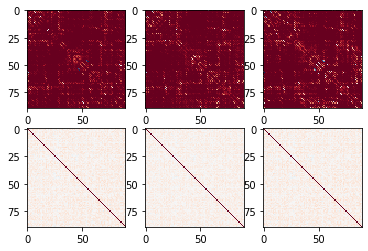

epoch 10
D_losses_realfake loss: 6.809815406799316
G_losses_realfake loss: 0.2634550929069519
G_losses_classes loss : 0.6826738119125366
classifier loss: 0.8182375431060791
Example classes: [[0.]
 [1.]
 [0.]]


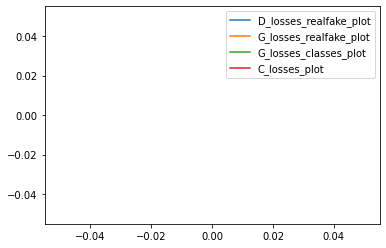

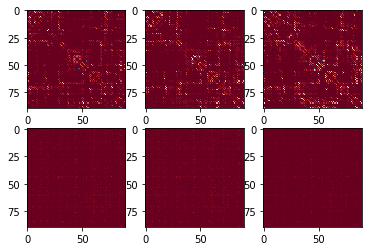

epoch 20
D_losses_realfake loss: -0.044229812920093536
G_losses_realfake loss: 0.10343123972415924
G_losses_classes loss : 0.6770249605178833
classifier loss: 0.7005330920219421
Example classes: [[0.]
 [1.]
 [0.]]


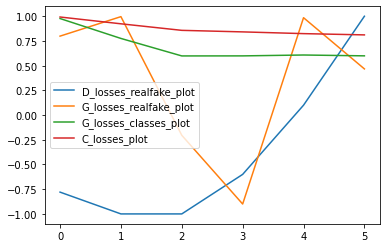

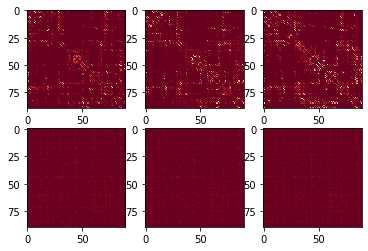

epoch 30
D_losses_realfake loss: -0.22503581643104553
G_losses_realfake loss: 0.08135762065649033
G_losses_classes loss : 0.6766321063041687
classifier loss: 0.6700690984725952
Example classes: [[0.]
 [1.]
 [0.]]


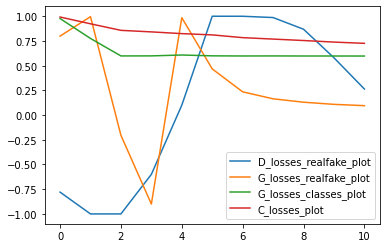

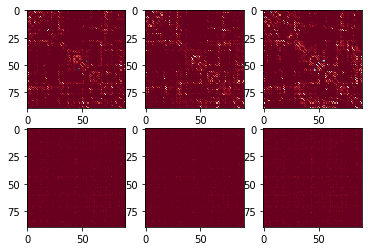

epoch 40
D_losses_realfake loss: -69.82633209228516
G_losses_realfake loss: -1.702758550643921
G_losses_classes loss : 0.6368440389633179
classifier loss: 0.5887028574943542
Example classes: [[0.]
 [1.]
 [0.]]


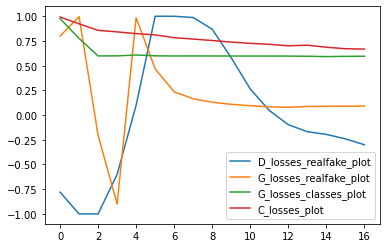

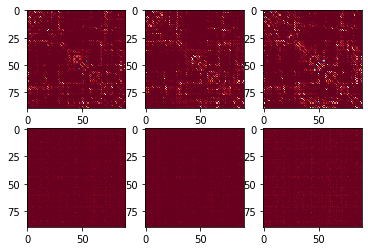

epoch 50
D_losses_realfake loss: -405.6601867675781
G_losses_realfake loss: -0.3647252023220062
G_losses_classes loss : 1.230417013168335
classifier loss: 1.2766302824020386
Example classes: [[0.]
 [1.]
 [0.]]


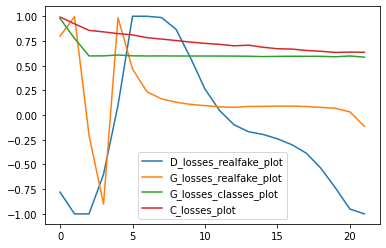

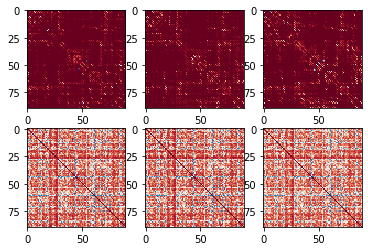

epoch 60
D_losses_realfake loss: -404.7998962402344
G_losses_realfake loss: -2.0882394313812256
G_losses_classes loss : 0.6061598062515259
classifier loss: 0.5888817310333252
Example classes: [[0.]
 [1.]
 [0.]]


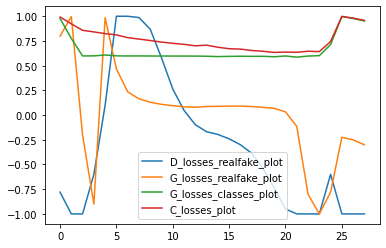

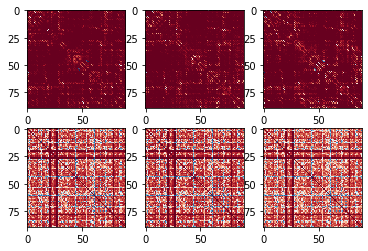

epoch 70
D_losses_realfake loss: -404.044189453125
G_losses_realfake loss: -2.0457682609558105
G_losses_classes loss : 0.5772873163223267
classifier loss: 0.4646635353565216
Example classes: [[0.]
 [1.]
 [0.]]


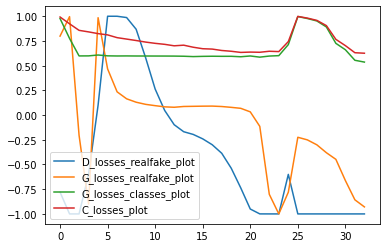

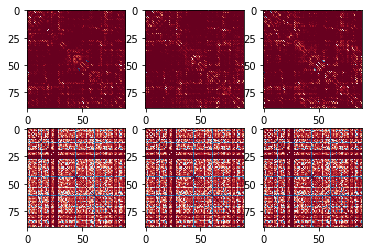

epoch 80
D_losses_realfake loss: -404.16363525390625
G_losses_realfake loss: -1.9581397771835327
G_losses_classes loss : 0.34310412406921387
classifier loss: 0.1757371872663498
Example classes: [[0.]
 [1.]
 [0.]]


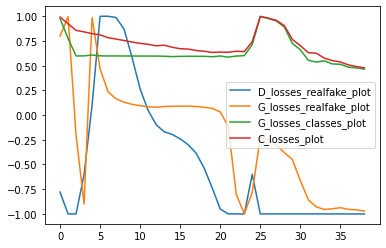

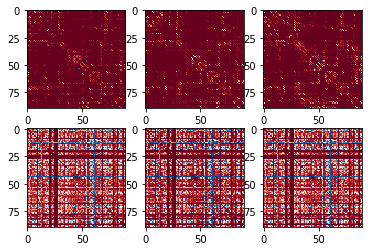

epoch 90
D_losses_realfake loss: -404.87225341796875
G_losses_realfake loss: -1.113551378250122
G_losses_classes loss : 0.022720715031027794
classifier loss: 0.010134329088032246
Example classes: [[0.]
 [1.]
 [0.]]


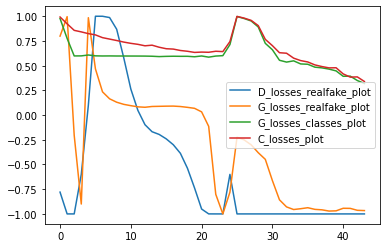

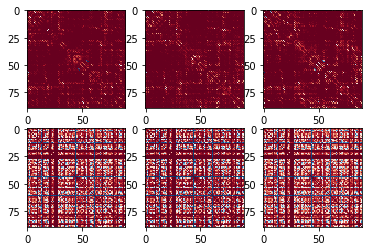

epoch 100
D_losses_realfake loss: -406.0256652832031
G_losses_realfake loss: -0.5665931701660156
G_losses_classes loss : 0.024579815566539764
classifier loss: 0.03119797073304653
Example classes: [[0.]
 [1.]
 [0.]]


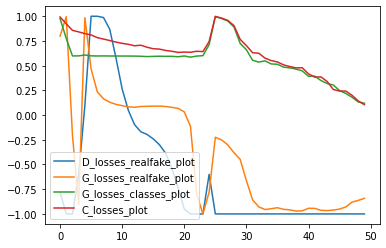

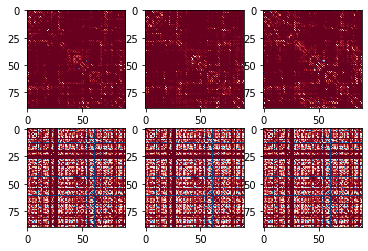

epoch 110
D_losses_realfake loss: -411.9910888671875
G_losses_realfake loss: -0.31717100739479065
G_losses_classes loss : 0.009209363721311092
classifier loss: 0.00976285059005022
Example classes: [[0.]
 [1.]
 [0.]]


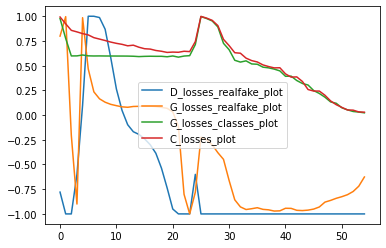

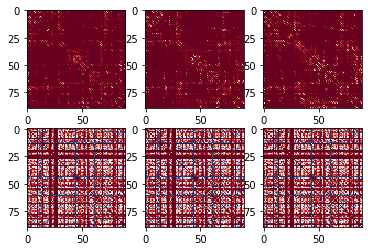

epoch 120
D_losses_realfake loss: -413.580810546875
G_losses_realfake loss: -0.34669560194015503
G_losses_classes loss : 0.01047244668006897
classifier loss: 0.003910061437636614
Example classes: [[0.]
 [1.]
 [0.]]


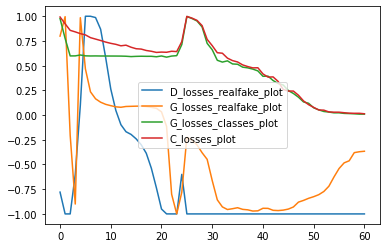

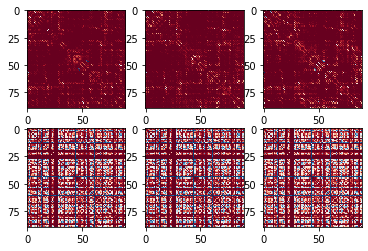

epoch 130
D_losses_realfake loss: -413.6754455566406
G_losses_realfake loss: -0.31125056743621826
G_losses_classes loss : 0.0020996653474867344
classifier loss: 0.008422181010246277
Example classes: [[0.]
 [1.]
 [0.]]


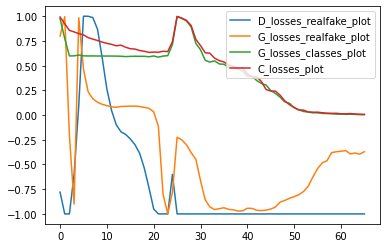

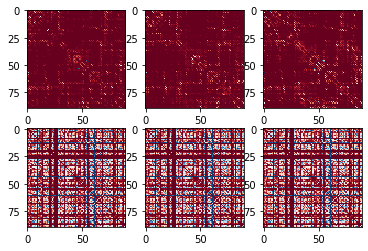

epoch 140
D_losses_realfake loss: -413.6214904785156
G_losses_realfake loss: -0.34030574560165405
G_losses_classes loss : 0.00024897255934774876
classifier loss: 0.0012573609128594398
Example classes: [[0.]
 [1.]
 [0.]]


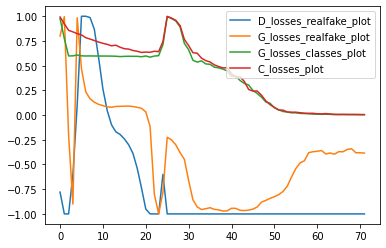

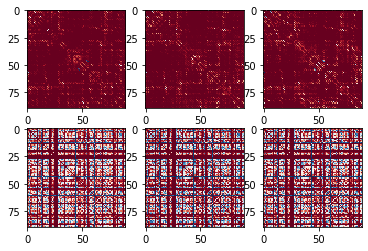

epoch 150
D_losses_realfake loss: -413.6906433105469
G_losses_realfake loss: -0.3211013078689575
G_losses_classes loss : 5.54697762709111e-05
classifier loss: 0.0002044558641500771
Example classes: [[0.]
 [1.]
 [0.]]


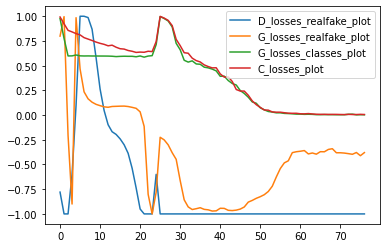

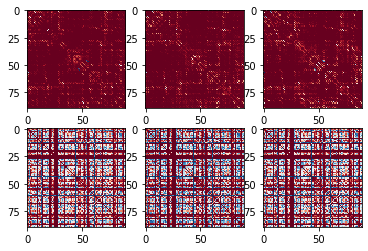

epoch 160
D_losses_realfake loss: -413.997314453125
G_losses_realfake loss: -0.29966968297958374
G_losses_classes loss : 0.00595000758767128
classifier loss: 0.006168406922370195
Example classes: [[0.]
 [1.]
 [0.]]


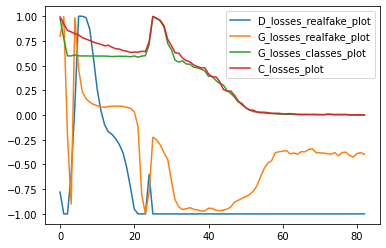

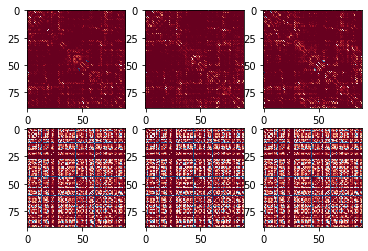

epoch 170
D_losses_realfake loss: -414.069091796875
G_losses_realfake loss: -0.319845050573349
G_losses_classes loss : 0.0011245999485254288
classifier loss: 0.003919900860637426
Example classes: [[0.]
 [1.]
 [0.]]


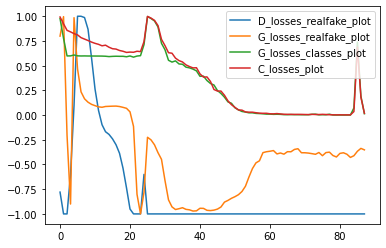

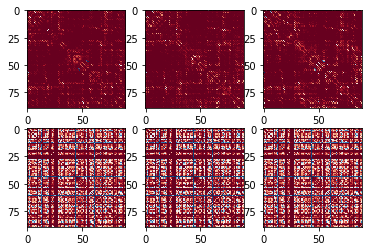

epoch 180
D_losses_realfake loss: -414.0154724121094
G_losses_realfake loss: -0.32047945261001587
G_losses_classes loss : 0.004953374620527029
classifier loss: 0.0023896300699561834
Example classes: [[0.]
 [1.]
 [0.]]


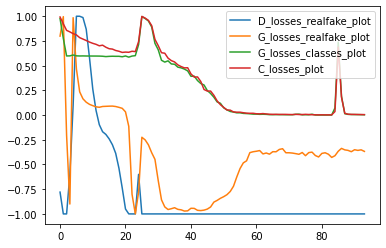

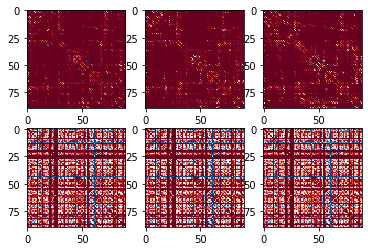

epoch 190
D_losses_realfake loss: -414.0693359375
G_losses_realfake loss: -0.28998953104019165
G_losses_classes loss : 0.0020377696491777897
classifier loss: 0.00041665375465527177
Example classes: [[0.]
 [1.]
 [0.]]


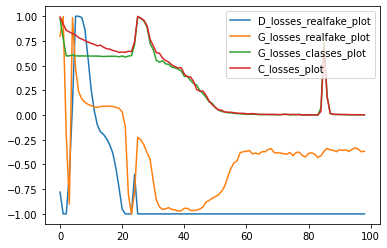

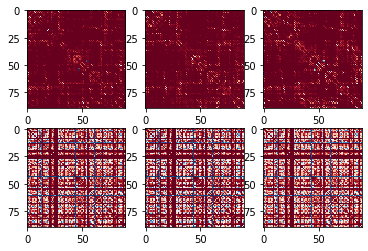

epoch 200
D_losses_realfake loss: -414.03802490234375
G_losses_realfake loss: -0.3137178421020508
G_losses_classes loss : 0.00046772160567343235
classifier loss: 0.000358178629539907
Example classes: [[0.]
 [1.]
 [0.]]


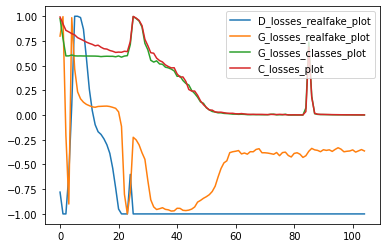

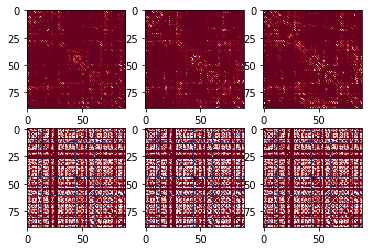

epoch 210
D_losses_realfake loss: -417.4589538574219
G_losses_realfake loss: -0.38064563274383545
G_losses_classes loss : 0.0002162028686143458
classifier loss: 0.00020334516011644155
Example classes: [[0.]
 [1.]
 [0.]]


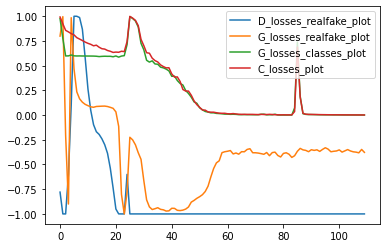

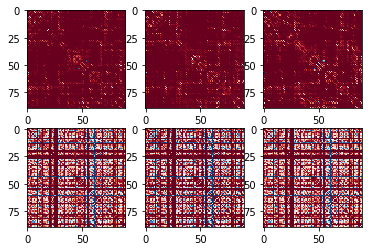

epoch 220
D_losses_realfake loss: -417.4434814453125
G_losses_realfake loss: -0.30540403723716736
G_losses_classes loss : 5.284919097903185e-06
classifier loss: 0.00010970792936859652
Example classes: [[0.]
 [1.]
 [0.]]


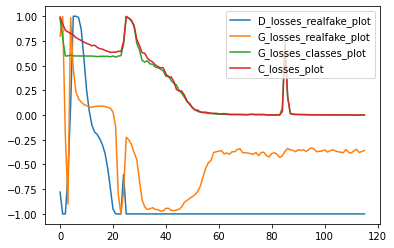

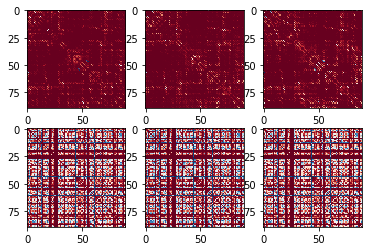

epoch 230
D_losses_realfake loss: -417.31268310546875
G_losses_realfake loss: -0.31374672055244446
G_losses_classes loss : 8.260350296040997e-05
classifier loss: 9.18657606234774e-05
Example classes: [[0.]
 [1.]
 [0.]]


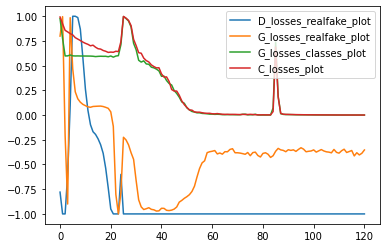

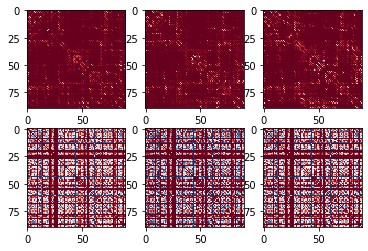

epoch 240
D_losses_realfake loss: -417.2708435058594
G_losses_realfake loss: -0.3194836378097534
G_losses_classes loss : 0.00016365290503017604
classifier loss: 0.00014089077012613416
Example classes: [[0.]
 [1.]
 [0.]]


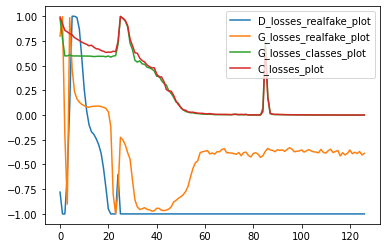

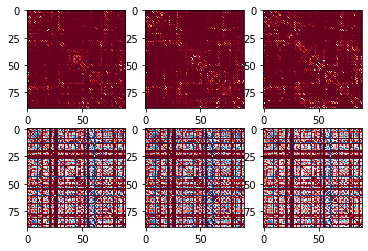

epoch 250
D_losses_realfake loss: -417.0641174316406
G_losses_realfake loss: -0.31189680099487305
G_losses_classes loss : 0.00031068685348145664
classifier loss: 0.0007156323408707976
Example classes: [[0.]
 [1.]
 [0.]]


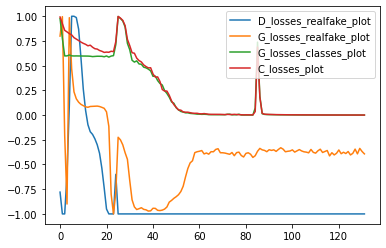

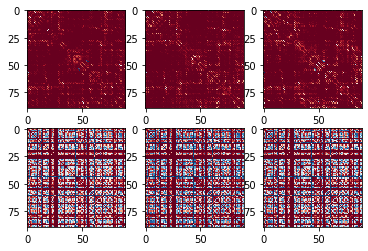

epoch 260
D_losses_realfake loss: -417.1759033203125
G_losses_realfake loss: -0.31097596883773804
G_losses_classes loss : 2.7815497105621034e-07
classifier loss: 6.886073970235884e-05
Example classes: [[0.]
 [1.]
 [0.]]


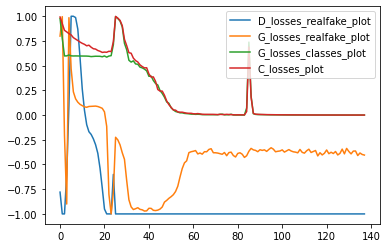

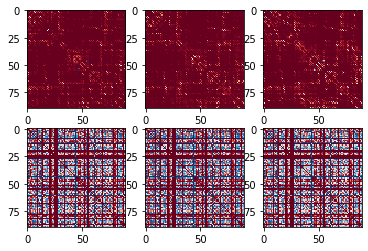

epoch 270
D_losses_realfake loss: -417.3982238769531
G_losses_realfake loss: -0.33091461658477783
G_losses_classes loss : 0.0006365415756590664
classifier loss: 0.001988267758861184
Example classes: [[0.]
 [1.]
 [0.]]


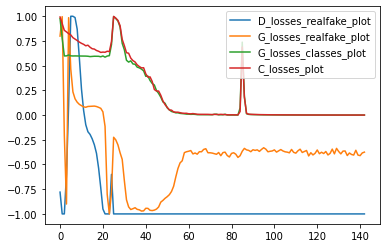

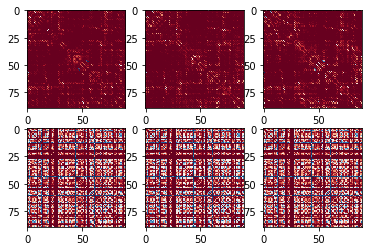

epoch 280
D_losses_realfake loss: -417.5747375488281
G_losses_realfake loss: -0.32682928442955017
G_losses_classes loss : 2.3126027372200042e-05
classifier loss: 7.462223584298044e-05
Example classes: [[0.]
 [1.]
 [0.]]


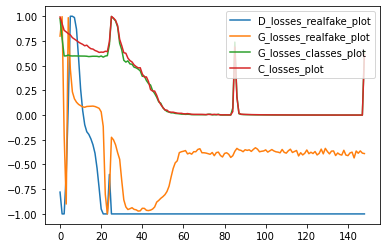

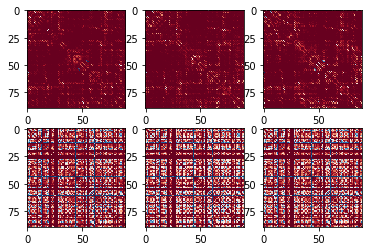

epoch 290
D_losses_realfake loss: -417.5804748535156
G_losses_realfake loss: -0.3507930636405945
G_losses_classes loss : 9.298201803176198e-06
classifier loss: 5.0861424824688584e-05
Example classes: [[0.]
 [1.]
 [0.]]


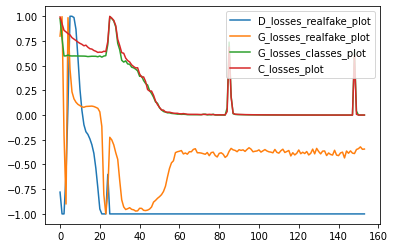

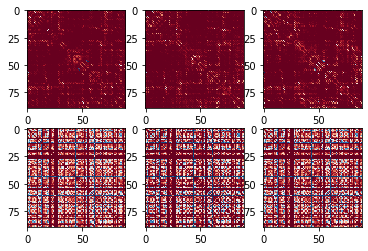

epoch 300
D_losses_realfake loss: -417.2746276855469
G_losses_realfake loss: -0.34461039304733276
G_losses_classes loss : 6.993555871304125e-06
classifier loss: 2.646400753292255e-05
Example classes: [[0.]
 [1.]
 [0.]]


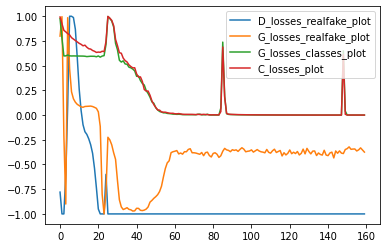

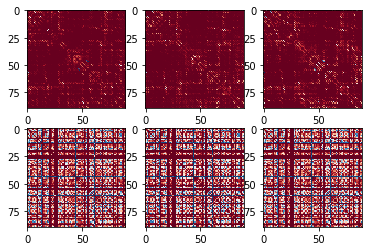

epoch 310
D_losses_realfake loss: -417.22900390625
G_losses_realfake loss: -0.4955260455608368
G_losses_classes loss : 1.5894570992713852e-07
classifier loss: 3.6477438698057085e-05
Example classes: [[0.]
 [1.]
 [0.]]


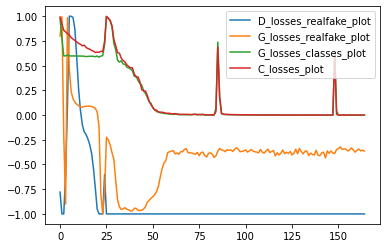

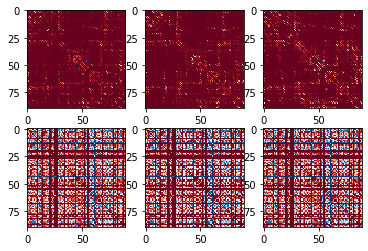

epoch 320
D_losses_realfake loss: -417.36077880859375
G_losses_realfake loss: -0.31864815950393677
G_losses_classes loss : 6.119355020928197e-06
classifier loss: 1.7364591258228756e-05
Example classes: [[0.]
 [1.]
 [0.]]


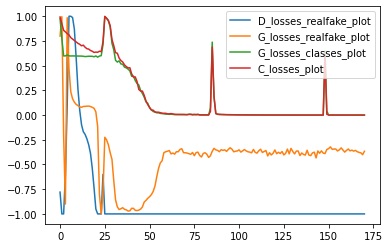

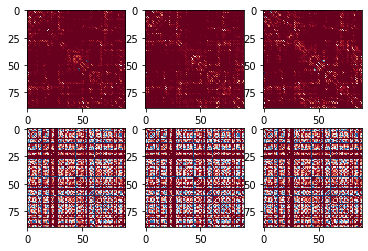

epoch 330
D_losses_realfake loss: -417.0086364746094
G_losses_realfake loss: -0.3133920431137085
G_losses_classes loss : 1.0331463045076816e-06
classifier loss: 1.4861260751786176e-05
Example classes: [[0.]
 [1.]
 [0.]]


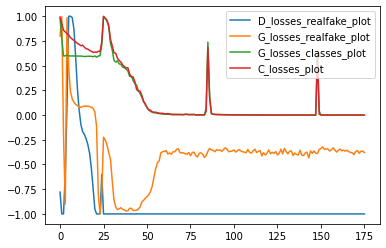

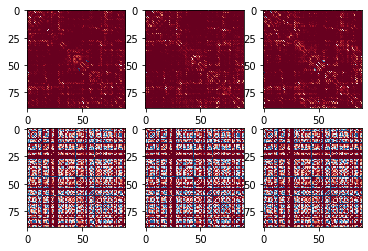

epoch 340
D_losses_realfake loss: -417.12603759765625
G_losses_realfake loss: -0.357634961605072
G_losses_classes loss : 1.589456815054291e-07
classifier loss: 1.2715536286123097e-05
Example classes: [[0.]
 [1.]
 [0.]]


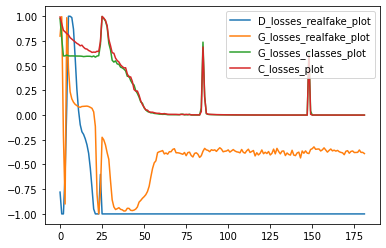

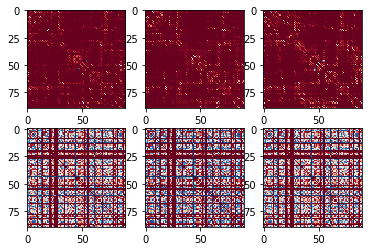

epoch 350
D_losses_realfake loss: -417.0202941894531
G_losses_realfake loss: -0.34570178389549255
G_losses_classes loss : 3.973642748178463e-08
classifier loss: 1.0967161870212294e-05
Example classes: [[0.]
 [1.]
 [0.]]


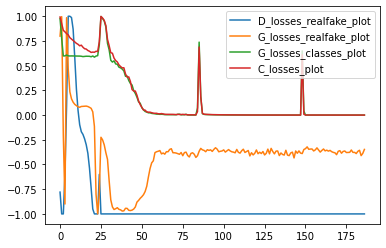

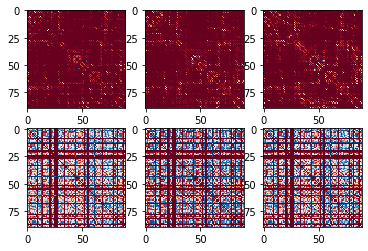

epoch 360
D_losses_realfake loss: -416.8619079589844
G_losses_realfake loss: -0.37193602323532104
G_losses_classes loss : 0.0
classifier loss: 9.616145689506084e-06
Example classes: [[0.]
 [1.]
 [0.]]


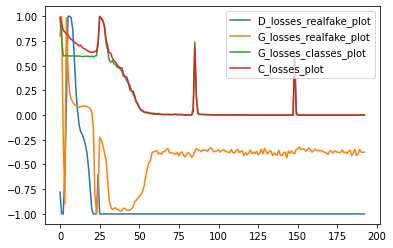

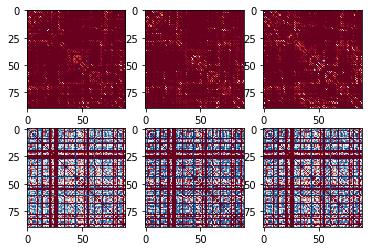

epoch 370
D_losses_realfake loss: -416.6560974121094
G_losses_realfake loss: -0.3988816738128662
G_losses_classes loss : 0.0
classifier loss: 8.424069164902903e-06
Example classes: [[0.]
 [1.]
 [0.]]


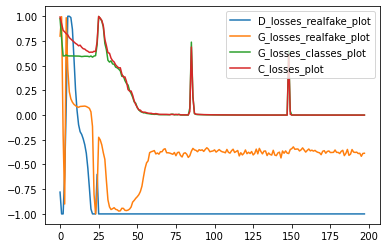

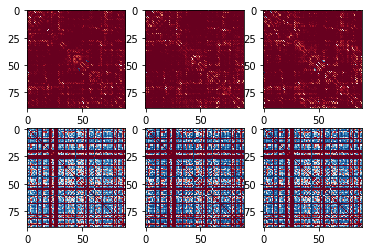

epoch 380
D_losses_realfake loss: -417.5060729980469
G_losses_realfake loss: -0.3548656404018402
G_losses_classes loss : 0.0009628738043829799
classifier loss: 0.00420763622969389
Example classes: [[0.]
 [1.]
 [0.]]


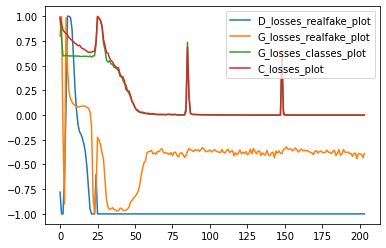

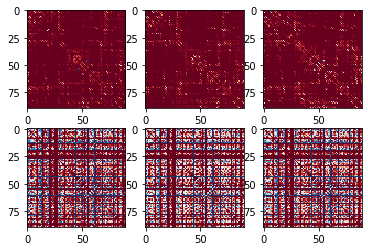

epoch 390
D_losses_realfake loss: -417.47314453125
G_losses_realfake loss: -0.32782208919525146
G_losses_classes loss : 0.0010532824089750648
classifier loss: 3.55633492290508e-05
Example classes: [[0.]
 [1.]
 [0.]]


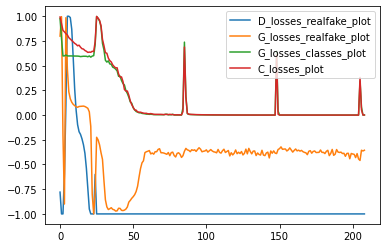

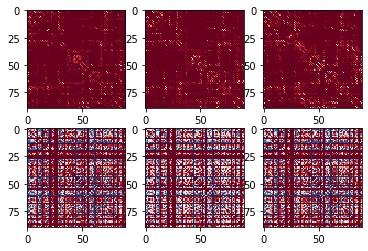

epoch 400
D_losses_realfake loss: -417.41473388671875
G_losses_realfake loss: -0.30189913511276245
G_losses_classes loss : 2.9841332434443757e-05
classifier loss: 7.3548624641262e-05
Example classes: [[0.]
 [1.]
 [0.]]


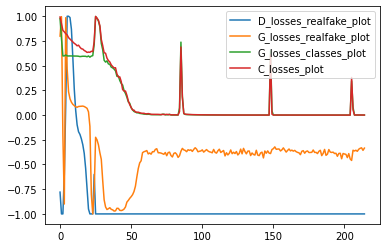

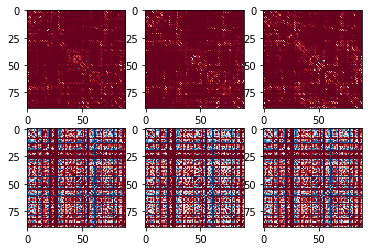

epoch 410
D_losses_realfake loss: -417.2354431152344
G_losses_realfake loss: -0.32737141847610474
G_losses_classes loss : 7.98693872638978e-06
classifier loss: 1.2159269317635335e-05
Example classes: [[0.]
 [1.]
 [0.]]


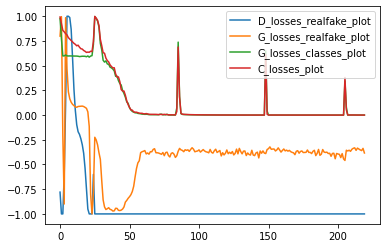

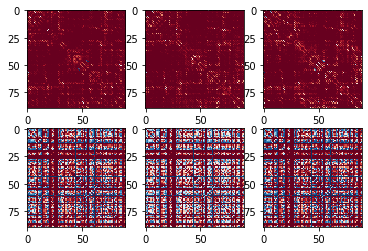

epoch 420
D_losses_realfake loss: -417.2459716796875
G_losses_realfake loss: -0.40230482816696167
G_losses_classes loss : 3.2981158710754244e-06
classifier loss: 7.851145346648991e-05
Example classes: [[0.]
 [1.]
 [0.]]


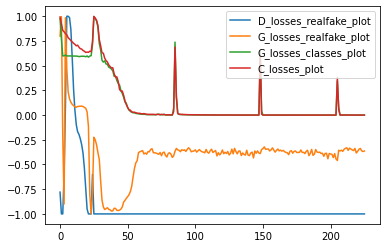

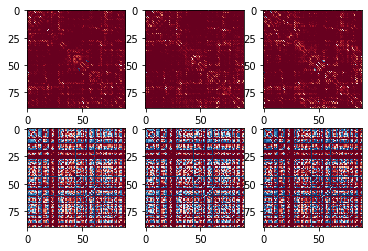

epoch 430
D_losses_realfake loss: -416.7930908203125
G_losses_realfake loss: -0.33149510622024536
G_losses_classes loss : 2.1337828002288006e-05
classifier loss: 7.152530542953173e-06
Example classes: [[0.]
 [1.]
 [0.]]


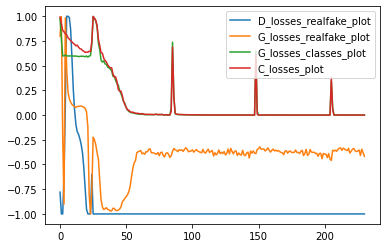

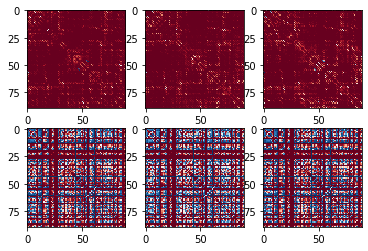

epoch 440
D_losses_realfake loss: -416.6226806640625
G_losses_realfake loss: -0.4660733938217163
G_losses_classes loss : 2.3841855067985307e-07
classifier loss: 5.483610038936604e-06
Example classes: [[0.]
 [1.]
 [0.]]


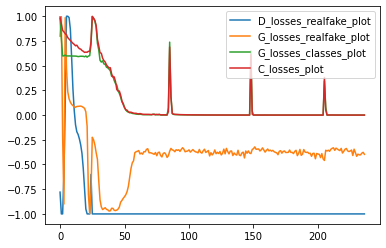

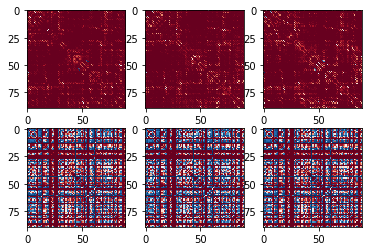

epoch 450
D_losses_realfake loss: -416.6337585449219
G_losses_realfake loss: -0.30638718605041504
G_losses_classes loss : 9.61608202487696e-06
classifier loss: 1.053007144946605e-05
Example classes: [[0.]
 [1.]
 [0.]]


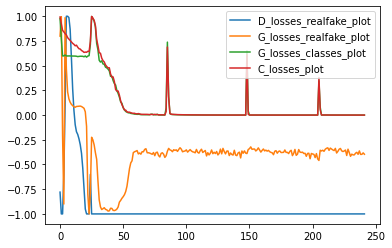

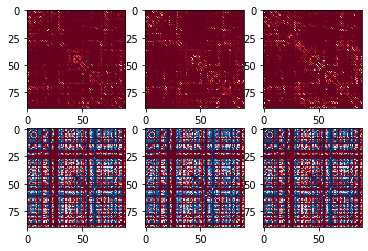

epoch 460
D_losses_realfake loss: -417.2551574707031
G_losses_realfake loss: -0.3233800530433655
G_losses_classes loss : 0.0002465487632434815
classifier loss: 0.00041990939644165337
Example classes: [[0.]
 [1.]
 [0.]]


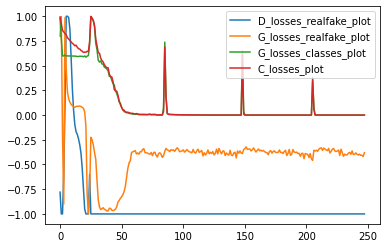

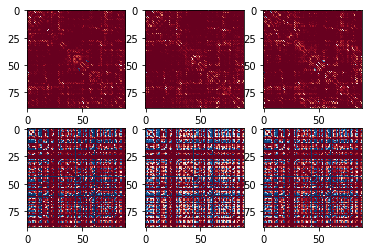

epoch 470
D_losses_realfake loss: -417.1600036621094
G_losses_realfake loss: -0.304176926612854
G_losses_classes loss : 0.00011117044778075069
classifier loss: 0.00011665603960864246
Example classes: [[0.]
 [1.]
 [0.]]


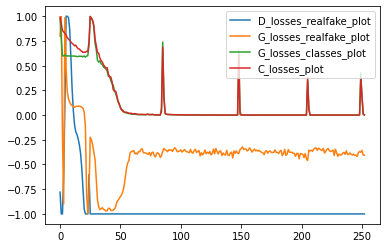

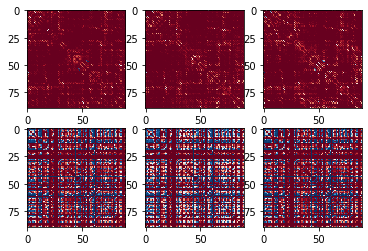

epoch 480
D_losses_realfake loss: -417.0842590332031
G_losses_realfake loss: -0.3044431209564209
G_losses_classes loss : 1.764264925441239e-05
classifier loss: 0.00020878648501820862
Example classes: [[0.]
 [1.]
 [0.]]


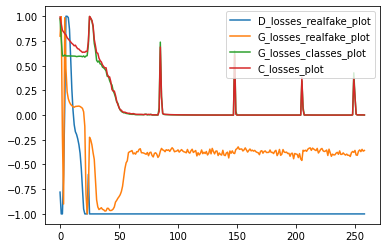

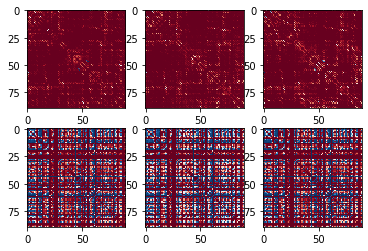

epoch 490
D_losses_realfake loss: -416.7142639160156
G_losses_realfake loss: -0.34285420179367065
G_losses_classes loss : 4.01318357035052e-05
classifier loss: 4.6927201765356585e-05
Example classes: [[0.]
 [1.]
 [0.]]


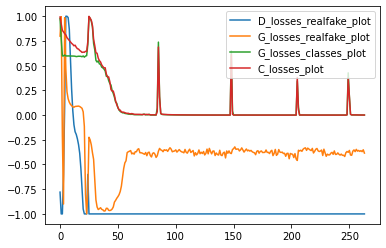

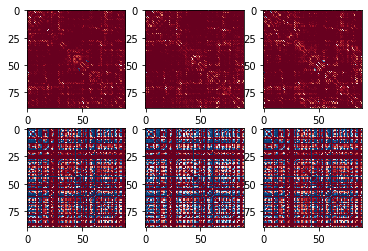

epoch 500
D_losses_realfake loss: -416.8273620605469
G_losses_realfake loss: -0.32548990845680237
G_losses_classes loss : 4.768344297190197e-06
classifier loss: 2.7139074518345296e-05
Example classes: [[0.]
 [1.]
 [0.]]


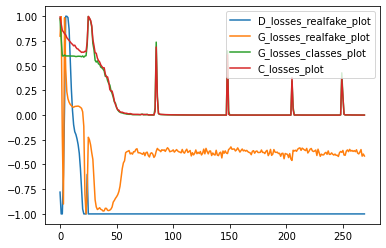

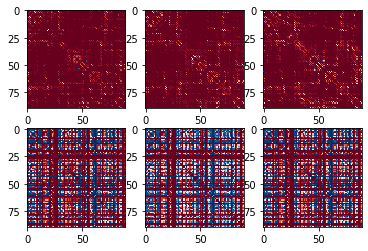

epoch 510
D_losses_realfake loss: -416.3661804199219
G_losses_realfake loss: -0.3176805377006531
G_losses_classes loss : 6.226472760317847e-05
classifier loss: 2.5391003873664886e-05
Example classes: [[0.]
 [1.]
 [0.]]


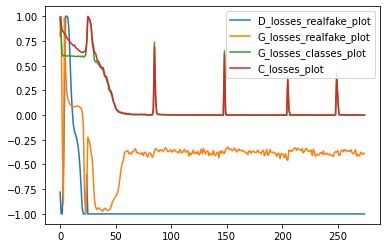

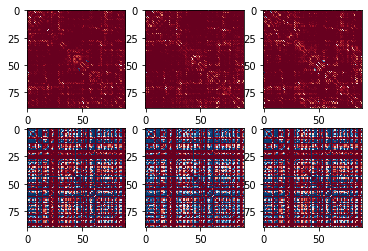

epoch 520
D_losses_realfake loss: -416.1691589355469
G_losses_realfake loss: -0.2926860451698303
G_losses_classes loss : 3.123198257526383e-05
classifier loss: 1.517915734439157e-05
Example classes: [[0.]
 [1.]
 [0.]]


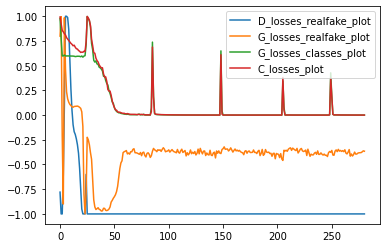

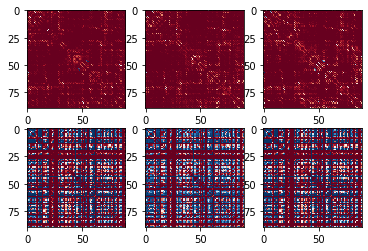

epoch 530
D_losses_realfake loss: -416.2502746582031
G_losses_realfake loss: -0.31836366653442383
G_losses_classes loss : 5.042201519245282e-05
classifier loss: 5.324655830918346e-06
Example classes: [[0.]
 [1.]
 [0.]]


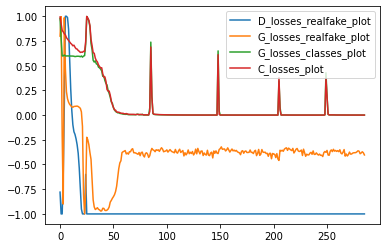

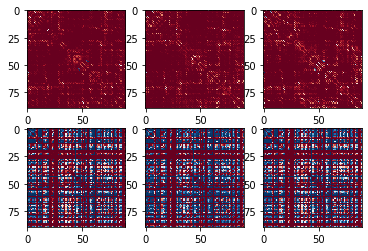

epoch 540
D_losses_realfake loss: -416.42431640625
G_losses_realfake loss: -0.36127275228500366
G_losses_classes loss : 2.1615920559270307e-05
classifier loss: 2.741811158557539e-06
Example classes: [[0.]
 [1.]
 [0.]]


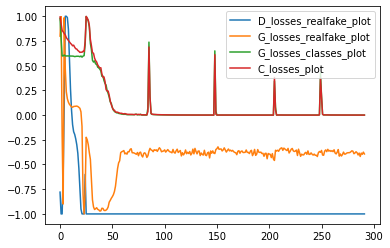

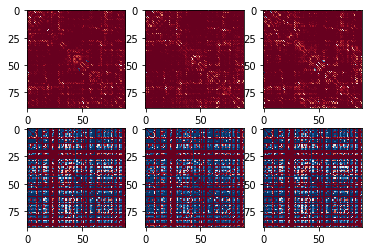

epoch 550
D_losses_realfake loss: -416.60821533203125
G_losses_realfake loss: -0.33754730224609375
G_losses_classes loss : 1.112619202103815e-06
classifier loss: 3.059700020457967e-06
Example classes: [[0.]
 [1.]
 [0.]]


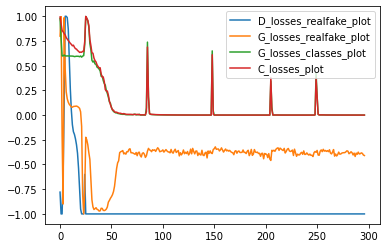

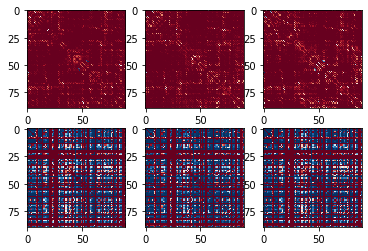

epoch 560
D_losses_realfake loss: -415.8827819824219
G_losses_realfake loss: -0.3252220153808594
G_losses_classes loss : 3.377588200237369e-06
classifier loss: 1.7563088476890698e-05
Example classes: [[0.]
 [1.]
 [0.]]


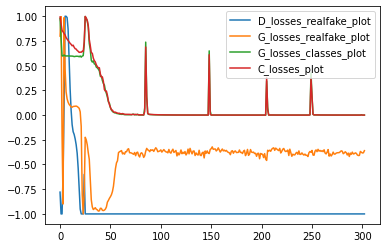

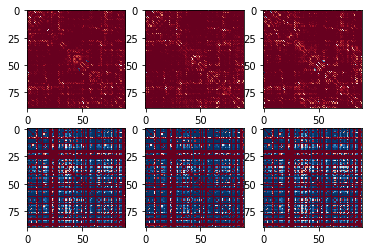

epoch 570
D_losses_realfake loss: -416.34930419921875
G_losses_realfake loss: -0.3115942180156708
G_losses_classes loss : 0.00021371484035626054
classifier loss: 0.0005605125334113836
Example classes: [[0.]
 [1.]
 [0.]]


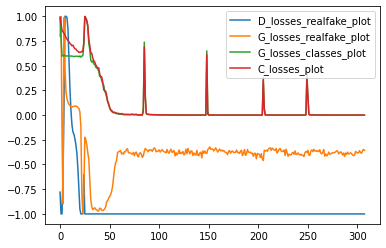

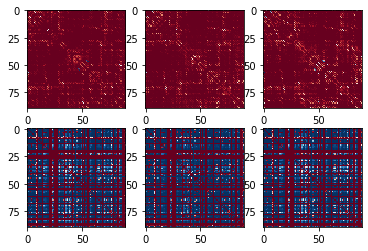

epoch 580
D_losses_realfake loss: -416.0743713378906
G_losses_realfake loss: -0.33759206533432007
G_losses_classes loss : 0.2967659831047058
classifier loss: 0.1873328536748886
Example classes: [[0.]
 [1.]
 [0.]]


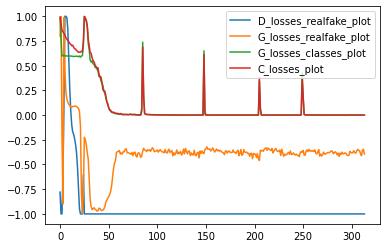

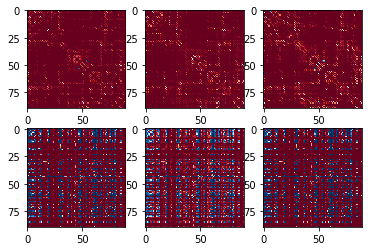

epoch 590
D_losses_realfake loss: -417.1817321777344
G_losses_realfake loss: -0.3069968819618225
G_losses_classes loss : 0.00812529306858778
classifier loss: 0.007321685552597046
Example classes: [[0.]
 [1.]
 [0.]]


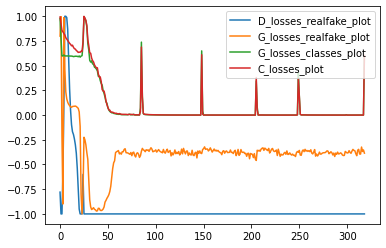

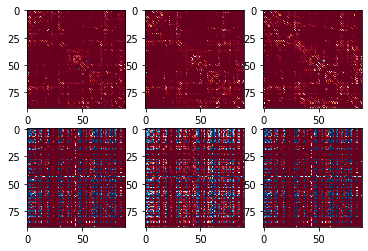

epoch 600
D_losses_realfake loss: -417.1329650878906
G_losses_realfake loss: -0.29339271783828735
G_losses_classes loss : 0.00016988719289656729
classifier loss: 6.750979810021818e-05
Example classes: [[0.]
 [1.]
 [0.]]


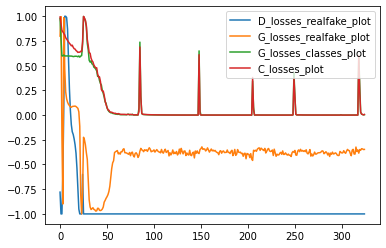

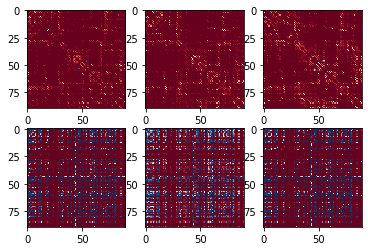

epoch 610
D_losses_realfake loss: -417.21319580078125
G_losses_realfake loss: -0.30361878871917725
G_losses_classes loss : 0.0010472958674654365
classifier loss: 0.0018161284970119596
Example classes: [[0.]
 [1.]
 [0.]]


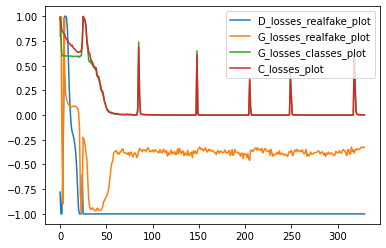

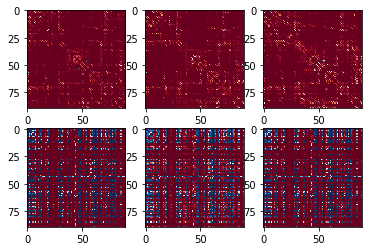

epoch 620
D_losses_realfake loss: -416.728271484375
G_losses_realfake loss: -0.2936895489692688
G_losses_classes loss : 0.000428099388955161
classifier loss: 0.00016920057532843202
Example classes: [[0.]
 [1.]
 [0.]]


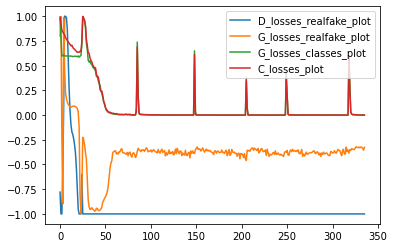

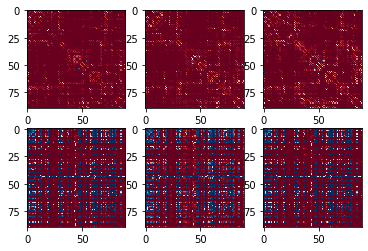

epoch 630
D_losses_realfake loss: -416.7938232421875
G_losses_realfake loss: -0.29732441902160645
G_losses_classes loss : 7.743851165287197e-05
classifier loss: 0.00018108326185029
Example classes: [[0.]
 [1.]
 [0.]]


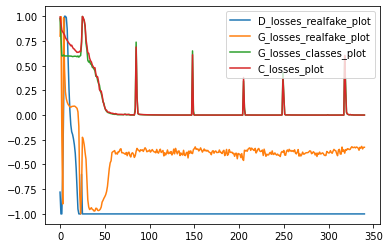

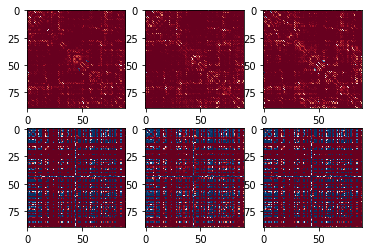

epoch 640
D_losses_realfake loss: -416.3170166015625
G_losses_realfake loss: -0.2933701276779175
G_losses_classes loss : 0.00020417847554199398
classifier loss: 0.00011157058906974271
Example classes: [[0.]
 [1.]
 [0.]]


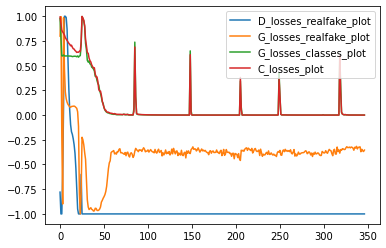

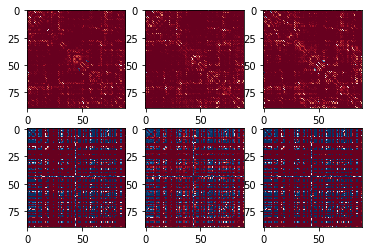

epoch 650
D_losses_realfake loss: -416.7228698730469
G_losses_realfake loss: -0.35201871395111084
G_losses_classes loss : 0.0001641673588892445
classifier loss: 0.00016623215924482793
Example classes: [[0.]
 [1.]
 [0.]]


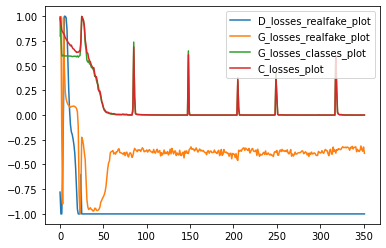

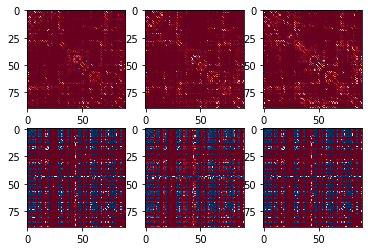

epoch 660
D_losses_realfake loss: -416.57806396484375
G_losses_realfake loss: -0.32336145639419556
G_losses_classes loss : 0.0002119047858286649
classifier loss: 0.00013676044181920588
Example classes: [[0.]
 [1.]
 [0.]]


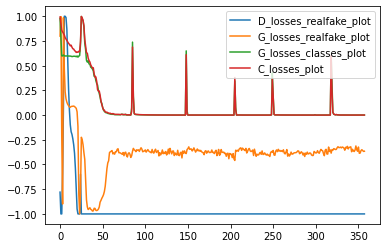

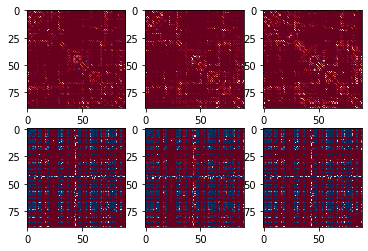

epoch 670
D_losses_realfake loss: -415.86907958984375
G_losses_realfake loss: -0.3068161606788635
G_losses_classes loss : 6.242311792448163e-05
classifier loss: 0.00011116837413283065
Example classes: [[0.]
 [1.]
 [0.]]


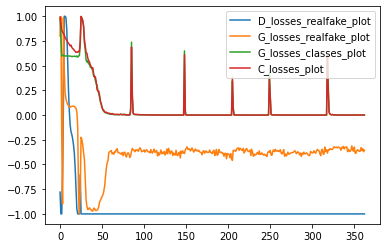

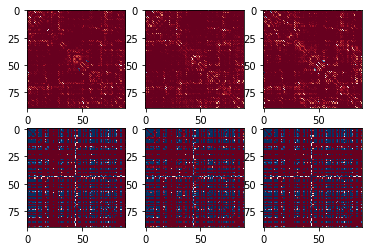

epoch 680
D_losses_realfake loss: -416.73272705078125
G_losses_realfake loss: -0.309498131275177
G_losses_classes loss : 0.00012539168528746814
classifier loss: 7.946763798827305e-05
Example classes: [[0.]
 [1.]
 [0.]]


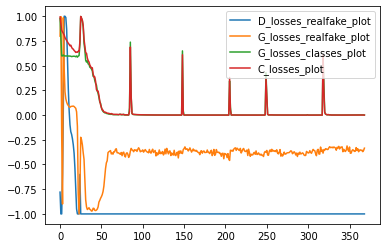

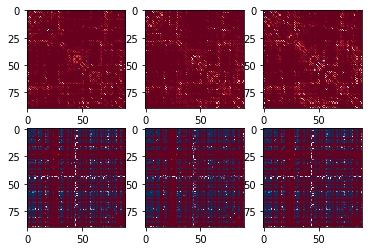

epoch 690
D_losses_realfake loss: -417.3365173339844
G_losses_realfake loss: -0.2883337140083313
G_losses_classes loss : 1.2159243851783685e-05
classifier loss: 1.3470508747559506e-05
Example classes: [[0.]
 [1.]
 [0.]]


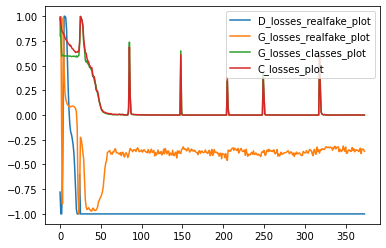

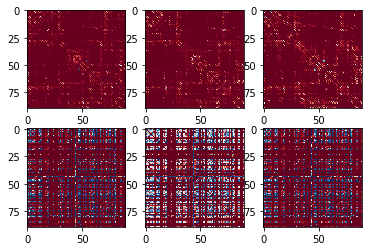

epoch 700
D_losses_realfake loss: -417.201171875
G_losses_realfake loss: -0.3104504942893982
G_losses_classes loss : 7.629319043189753e-06
classifier loss: 6.6756660999089945e-06
Example classes: [[0.]
 [1.]
 [0.]]


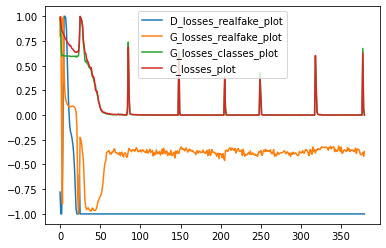

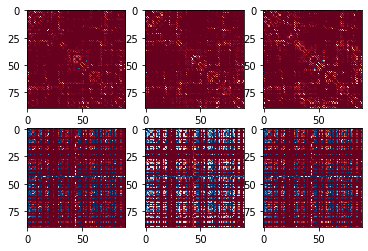

epoch 710
D_losses_realfake loss: -416.8458251953125
G_losses_realfake loss: -0.2973140478134155
G_losses_classes loss : 1.9868211609264108e-07
classifier loss: 5.56309828425583e-07
Example classes: [[0.]
 [1.]
 [0.]]


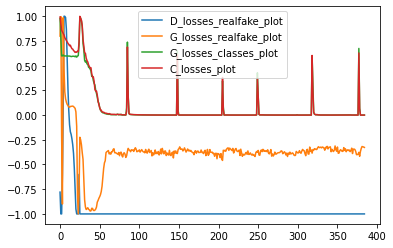

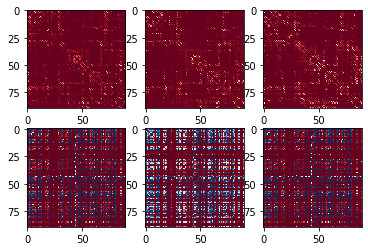

epoch 720
D_losses_realfake loss: -416.8943176269531
G_losses_realfake loss: -0.2954331338405609
G_losses_classes loss : 4.7683701609457785e-07
classifier loss: 4.768370445162873e-07
Example classes: [[0.]
 [1.]
 [0.]]


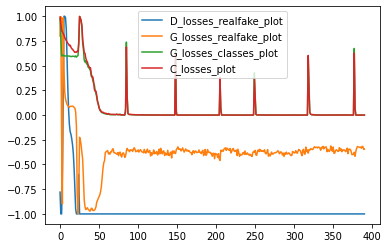

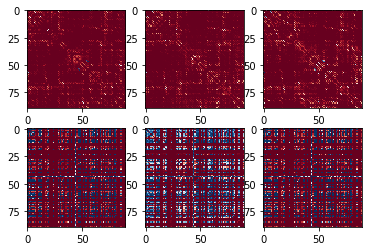

epoch 730
D_losses_realfake loss: -416.64447021484375
G_losses_realfake loss: -0.30133044719696045
G_losses_classes loss : 2.34834060393041e-05
classifier loss: 4.3710062413993e-07
Example classes: [[0.]
 [1.]
 [0.]]


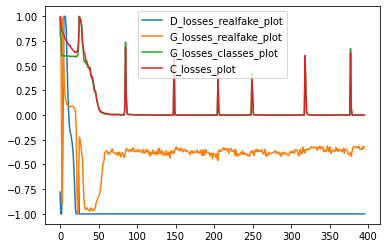

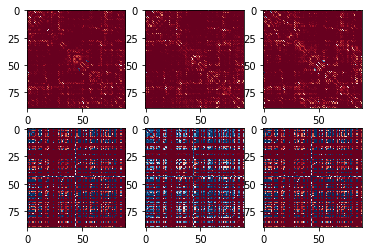

epoch 740
D_losses_realfake loss: -416.5299377441406
G_losses_realfake loss: -0.31671732664108276
G_losses_classes loss : 3.973642748178463e-08
classifier loss: 2.781549426345009e-07
Example classes: [[0.]
 [1.]
 [0.]]


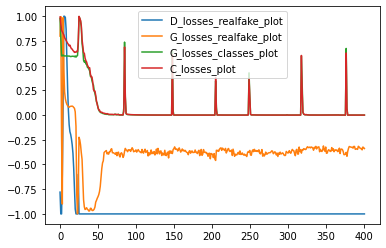

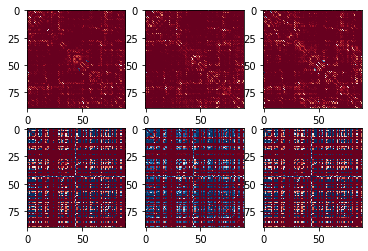

epoch 750
D_losses_realfake loss: -416.76531982421875
G_losses_realfake loss: -0.3120752274990082
G_losses_classes loss : 0.0
classifier loss: 1.3113003660691902e-06
Example classes: [[0.]
 [1.]
 [0.]]


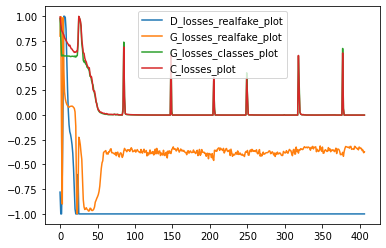

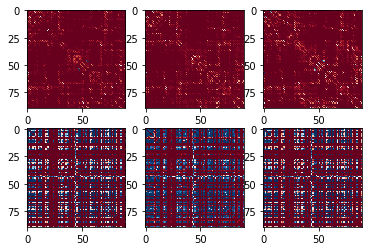

epoch 760
D_losses_realfake loss: -416.57342529296875
G_losses_realfake loss: -0.3331167697906494
G_losses_classes loss : 7.947285496356926e-08
classifier loss: 2.7815497105621034e-07
Example classes: [[0.]
 [1.]
 [0.]]


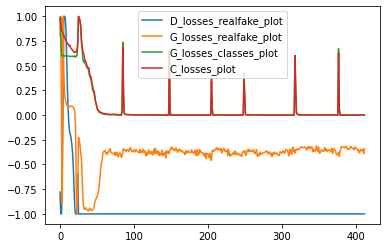

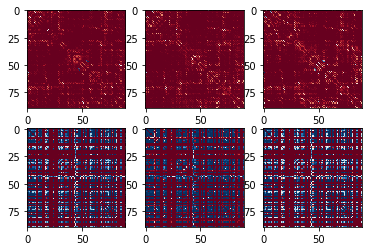

epoch 770
D_losses_realfake loss: -416.9573669433594
G_losses_realfake loss: -0.28493213653564453
G_losses_classes loss : 0.0
classifier loss: 2.781549426345009e-07
Example classes: [[0.]
 [1.]
 [0.]]


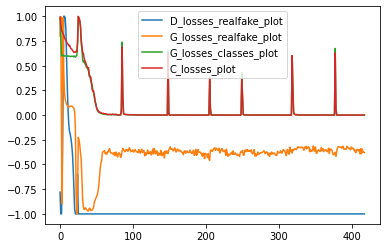

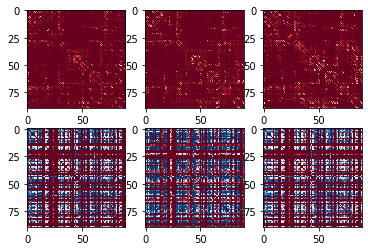

epoch 780
D_losses_realfake loss: -417.02783203125
G_losses_realfake loss: -0.3114541471004486
G_losses_classes loss : 0.0
classifier loss: 2.3841852225814364e-07
Example classes: [[0.]
 [1.]
 [0.]]


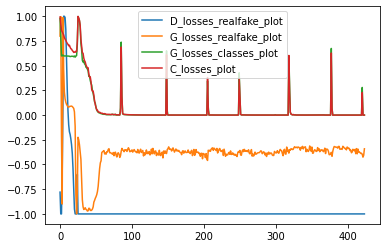

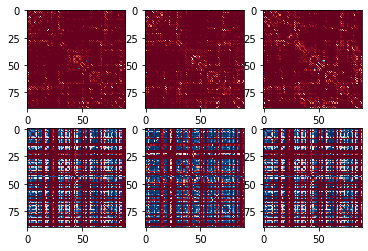

epoch 790
D_losses_realfake loss: -416.42645263671875
G_losses_realfake loss: -0.3355875611305237
G_losses_classes loss : 0.0
classifier loss: 1.9868211609264108e-07
Example classes: [[0.]
 [1.]
 [0.]]


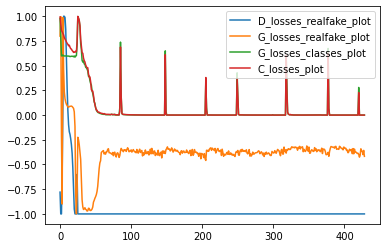

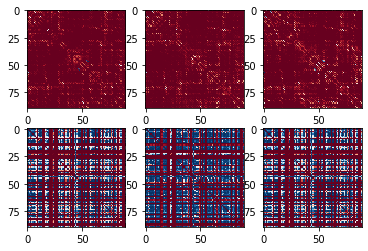

epoch 800
D_losses_realfake loss: -416.0143737792969
G_losses_realfake loss: -0.3317180275917053
G_losses_classes loss : 0.0
classifier loss: 1.589456815054291e-07
Example classes: [[0.]
 [1.]
 [0.]]


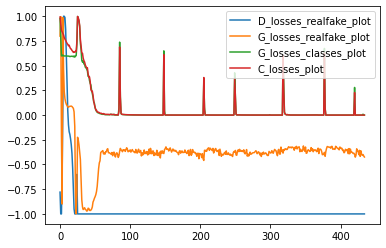

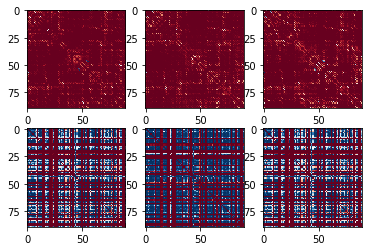

epoch 810
D_losses_realfake loss: -416.0823669433594
G_losses_realfake loss: -0.4017941355705261
G_losses_classes loss : 0.0
classifier loss: 1.1920927533992653e-07
Example classes: [[0.]
 [1.]
 [0.]]


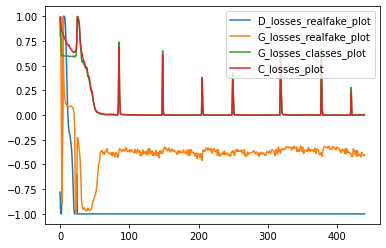

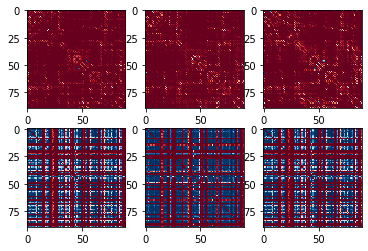

epoch 820
D_losses_realfake loss: -416.2272033691406
G_losses_realfake loss: -0.45041030645370483
G_losses_classes loss : 0.0
classifier loss: 1.1920927533992653e-07
Example classes: [[0.]
 [1.]
 [0.]]


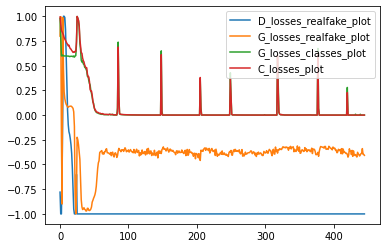

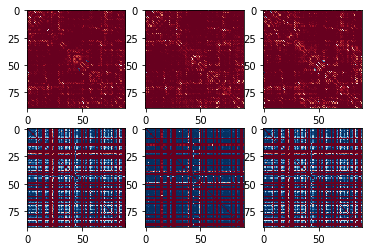

epoch 830
D_losses_realfake loss: -415.7204895019531
G_losses_realfake loss: -0.39754611253738403
G_losses_classes loss : 0.0
classifier loss: 7.947285496356926e-08
Example classes: [[0.]
 [1.]
 [0.]]


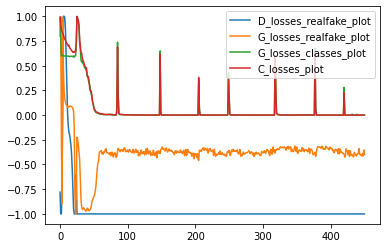

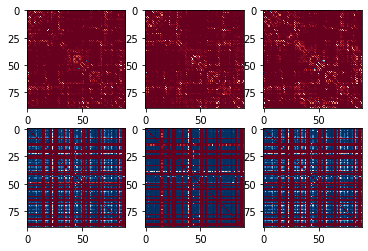

epoch 840
D_losses_realfake loss: -415.66485595703125
G_losses_realfake loss: -0.36159712076187134
G_losses_classes loss : 0.0
classifier loss: 7.947285496356926e-08
Example classes: [[0.]
 [1.]
 [0.]]


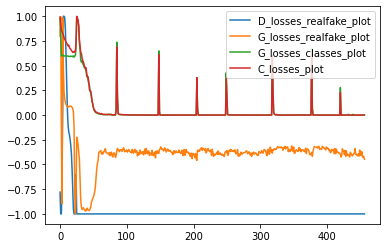

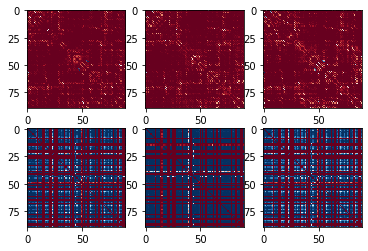

epoch 850
D_losses_realfake loss: -416.10675048828125
G_losses_realfake loss: -0.38310036063194275
G_losses_classes loss : 0.0
classifier loss: 7.947285496356926e-08
Example classes: [[0.]
 [1.]
 [0.]]


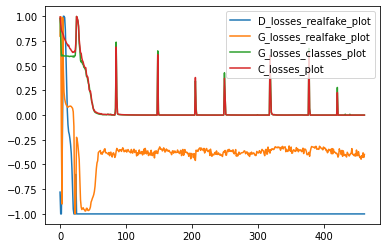

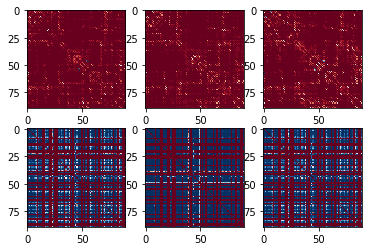

epoch 860
D_losses_realfake loss: -415.9920959472656
G_losses_realfake loss: -0.3762279450893402
G_losses_classes loss : 0.0
classifier loss: 1.1920928244535389e-07
Example classes: [[0.]
 [1.]
 [0.]]


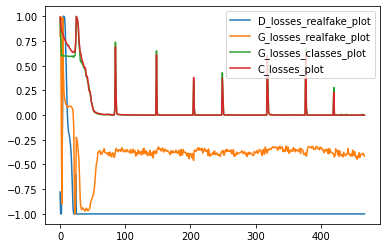

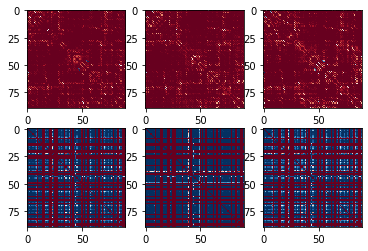

epoch 870
D_losses_realfake loss: -415.7586364746094
G_losses_realfake loss: -0.39436304569244385
G_losses_classes loss : 0.0
classifier loss: 7.947285496356926e-08
Example classes: [[0.]
 [1.]
 [0.]]


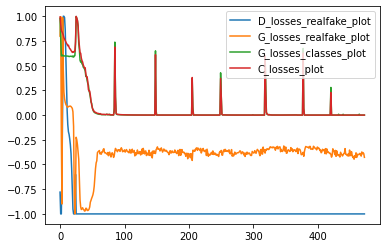

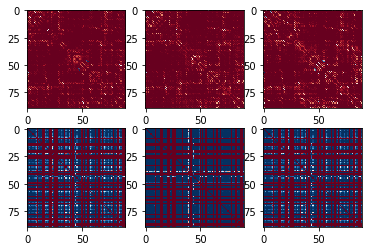

epoch 880
D_losses_realfake loss: -415.9957580566406
G_losses_realfake loss: -0.5806608200073242
G_losses_classes loss : 2.185498487961013e-06
classifier loss: 4.371005388748017e-07
Example classes: [[0.]
 [1.]
 [0.]]


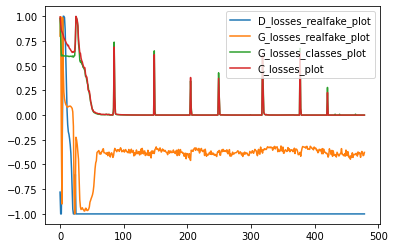

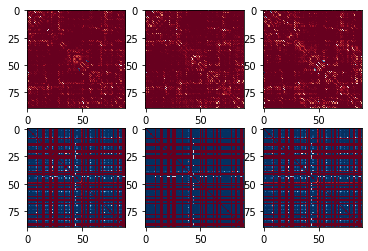

epoch 890
D_losses_realfake loss: -415.64788818359375
G_losses_realfake loss: -0.3450390100479126
G_losses_classes loss : 7.947285496356926e-08
classifier loss: 3.973642748178463e-08
Example classes: [[0.]
 [1.]
 [0.]]


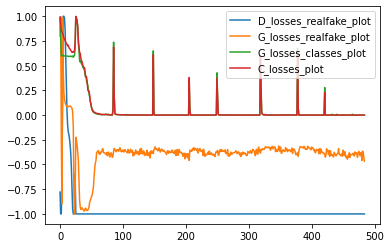

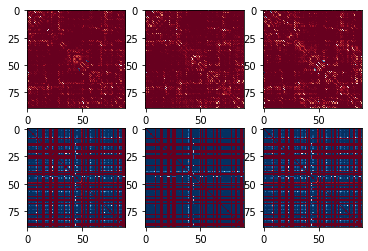

epoch 900
D_losses_realfake loss: -415.9014892578125
G_losses_realfake loss: -0.39922842383384705
G_losses_classes loss : 2.781549142127915e-07
classifier loss: 3.973642748178463e-08
Example classes: [[0.]
 [1.]
 [0.]]


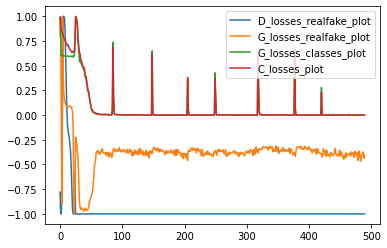

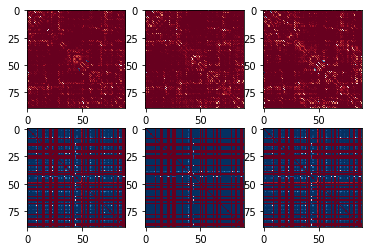

epoch 910
D_losses_realfake loss: -415.8050537109375
G_losses_realfake loss: -0.403799831867218
G_losses_classes loss : 5.165732659406785e-07
classifier loss: 1.1920928244535389e-07
Example classes: [[0.]
 [1.]
 [0.]]


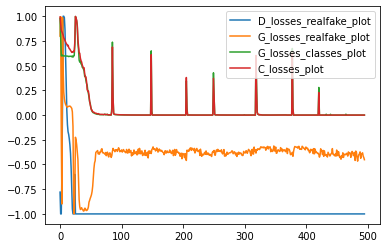

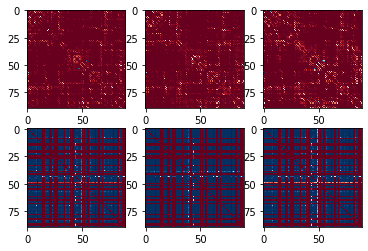

epoch 920
D_losses_realfake loss: -415.84564208984375
G_losses_realfake loss: -0.3667638897895813
G_losses_classes loss : 7.549919018856599e-07
classifier loss: 6.357826123348786e-07
Example classes: [[0.]
 [1.]
 [0.]]


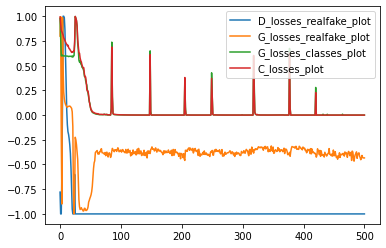

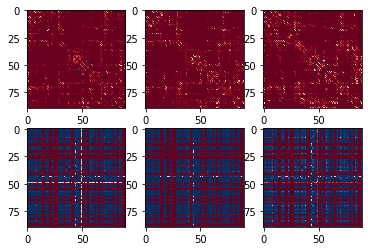

epoch 930
D_losses_realfake loss: -415.66650390625
G_losses_realfake loss: -0.3812751770019531
G_losses_classes loss : 5.165714355825912e-06
classifier loss: 7.152551688704989e-07
Example classes: [[0.]
 [1.]
 [0.]]


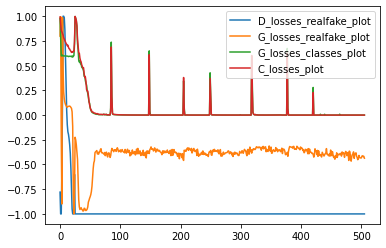

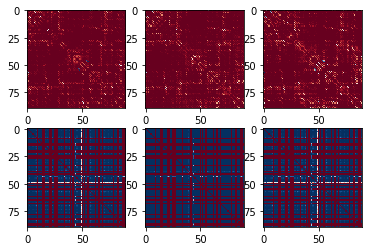

epoch 940
D_losses_realfake loss: -414.8648376464844
G_losses_realfake loss: -0.3729938864707947
G_losses_classes loss : 2.054338256129995e-05
classifier loss: 2.5311761419288814e-05
Example classes: [[0.]
 [1.]
 [0.]]


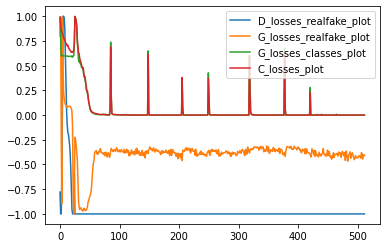

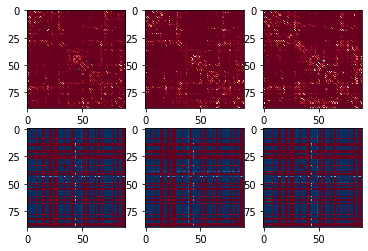

epoch 950
D_losses_realfake loss: -415.1020812988281
G_losses_realfake loss: -0.40285858511924744
G_losses_classes loss : 3.536536041792715e-06
classifier loss: 8.145933861669619e-06
Example classes: [[0.]
 [1.]
 [0.]]


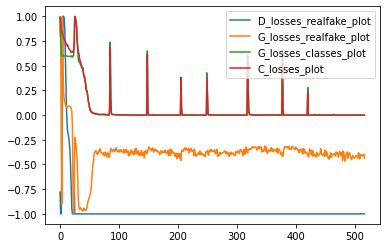

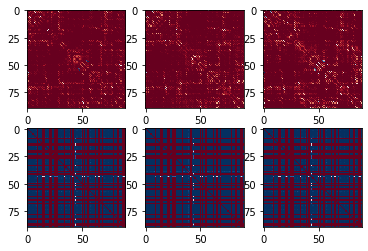

epoch 960
D_losses_realfake loss: -415.0382080078125
G_losses_realfake loss: -0.3791702389717102
G_losses_classes loss : 4.847832315135747e-06
classifier loss: 5.324666290107416e-06
Example classes: [[0.]
 [1.]
 [0.]]


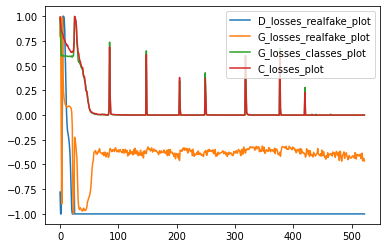

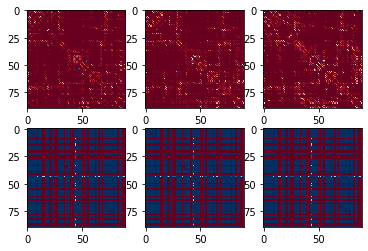

epoch 970
D_losses_realfake loss: -415.27734375
G_losses_realfake loss: -0.3975500762462616
G_losses_classes loss : 2.8610190838662675e-06
classifier loss: 3.854426267935196e-06
Example classes: [[0.]
 [1.]
 [0.]]


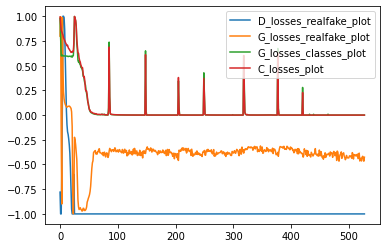

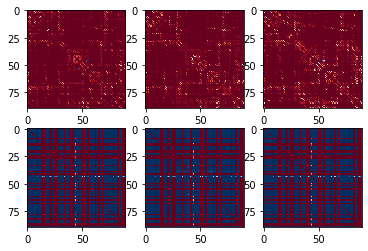

epoch 980
D_losses_realfake loss: -415.4576416015625
G_losses_realfake loss: -0.4416520297527313
G_losses_classes loss : 1.5497193999181036e-06
classifier loss: 2.066291926894337e-06
Example classes: [[0.]
 [1.]
 [0.]]


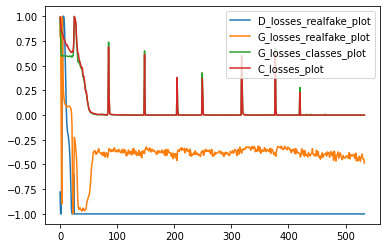

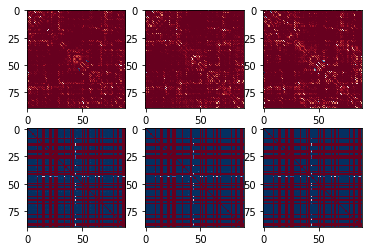

epoch 990
D_losses_realfake loss: -415.7431335449219
G_losses_realfake loss: -0.3868621587753296
G_losses_classes loss : 1.549719627291779e-06
classifier loss: 1.7484014733781805e-06
Example classes: [[0.]
 [1.]
 [0.]]


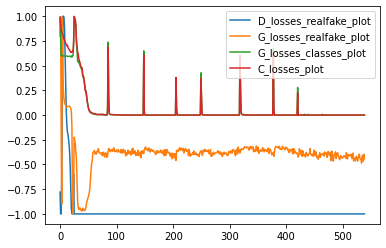

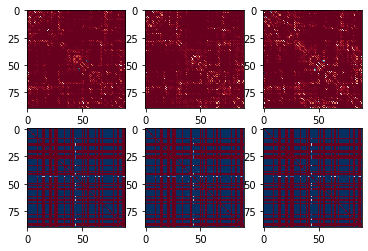

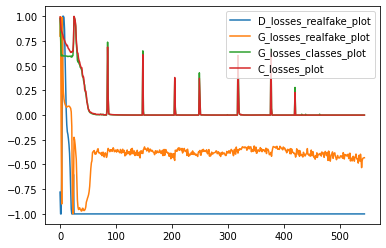

In [72]:
iter = 0
for epoch in range(num_epochs):
    # For each batch in the dataloader
    
    for  real in train_loader:
        
        real=real.to(device)
        n_samples=torch.tensor(real.num_graphs).cuda()
        #print(real, "real")
        label_classes=real.y.view(-1,1).cuda()
        #print(label_classes, "classes")
        


#################### Training discriminator ####################
        for i in range(5):
          for p in modelD.parameters():
            p.requires_grad = True
            p.data.clamp_(-0.01, 0.01)
            
          optimizerD.zero_grad()  
          dis_errD_real = modelD(real)
          #print(dis_errD_real, "model D output")
          D_loss_real = (-1. * torch.mean(dis_errD_real)) 

          noise=get_noise(n_samples,label_classes,90).cuda()
          fake_mlp=modelG(noise).to(device)
          fake=mlp_to_graph_batch(fake_mlp.detach(),n_samples).to(device)
          dis_errD_fake = modelD(fake)
          D_loss_fake = (1. * torch.mean(dis_errD_fake))
          D_losses_realfake = D_loss_real+D_loss_fake
          D_losses_realfake.backward()
          optimizerD.step()

#################### Training generator ####################
        #if iter % 5 == 1:
        for p in modelD.parameters():
              p.requires_grad = False
        optimizerG.zero_grad() 

        noise=get_noise(n_samples,label_classes,90).cuda()
        fake_mlp=modelG(noise).to(device)
        fake=mlp_to_graph_batch(fake_mlp,n_samples).to(device)
        dis_output  = modelD(fake)
        #print(fake, "dis_output")
        G_losses_realfake =  (-1. * torch.mean(dis_output)) 
        G_losses_realfake.backward(retain_graph=True)
        #G_losses_realfake.backward()
        optimizerG.step()
      ##### Training generator on classifier ###########
      #if iter % 2 == 1:
        for p in modelC.parameters():
              p.requires_grad = False
        optimizerG.zero_grad() 
        noise=get_noise(n_samples,label_classes,90).cuda()
        fake_mlp=modelG(noise).to(device)
        fake=mlp_to_graph_batch(fake_mlp,n_samples).to(device)
        cls_output  = modelC(fake)
        G_losses_classes =  criterion_classes(cls_output,label_classes)
        G_losses_classes.backward()
        optimizerG.step()

#################### Training classifier   #################
        for p in modelC.parameters():
              p.requires_grad = True 
        optimizerC.zero_grad()  
        cls_errD_real = modelC(real)
        C_loss_real = criterion_classes(cls_errD_real,label_classes) 
        noise=get_noise(n_samples,label_classes,90).cuda()
        fake_mlp=modelG(noise).to(device)
        fake=mlp_to_graph_batch(fake_mlp.detach(),n_samples).to(device)
        cls_errD_fake = modelC(fake)
        C_loss_fake = criterion_classes(cls_errD_fake,label_classes) 
        C_losses = C_loss_real+C_loss_fake
        C_losses.backward()
        optimizerC.step()


#################### Visualization ####################
        #if iter % 10 == 1:
        D_losses_realfake_plot += [torch.mean(torch.tanh(D_losses_realfake)).item()]
        G_losses_realfake_plot += [torch.mean(torch.tanh(G_losses_realfake)).item()]
        G_losses_classes_plot += [torch.mean(torch.tanh(G_losses_classes)).item()]
        C_losses_plot += [torch.mean(torch.tanh(C_losses)).item()]
        
        iter = iter + 1

    if epoch % 10 == 0:
      print(f"epoch {epoch}")
      print(f"D_losses_realfake loss: {D_losses_realfake.item()}")
      print(f"G_losses_realfake loss: {G_losses_realfake.item()}")
      print(f"G_losses_classes loss : {G_losses_classes.item()}")
      print(f"classifier loss: {C_losses.item()}")
      print(f"Example classes: {label_classes.detach().cpu().numpy()}")

  
      
      with torch.no_grad():
        f, axarr = plt.subplots(2,3)
        tmp=graph_to_adj(Batch.to_data_list(real)[0]).detach().cpu()
        axarr[0,0].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")
        tmp=graph_to_adj(Batch.to_data_list(real)[1]).detach().cpu()
        axarr[0,1].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")
        tmp=graph_to_adj(Batch.to_data_list(real)[2]).detach().cpu()
        axarr[0,2].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")

        tmp=graph_to_adj(Batch.to_data_list(fake)[0]).detach().cpu()
        axarr[1,0].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")
        tmp=graph_to_adj(Batch.to_data_list(fake)[1]).detach().cpu()
        axarr[1,1].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")
        tmp=graph_to_adj(Batch.to_data_list(fake)[2]).detach().cpu()
        axarr[1,2].imshow(tmp,cmap='RdBu',vmin=0, vmax=1, interpolation="None")
        plt.show()



        step_bins = 20
        x_axis = sorted([i * step_bins for i in range(len(D_losses_realfake_plot) // step_bins)] * step_bins)
        num_examples = (len(D_losses_realfake_plot) // step_bins) * step_bins
        plt.plot(
                  range(num_examples // step_bins), 
                  torch.Tensor(D_losses_realfake_plot[:num_examples]).view(-1, step_bins).mean(1),
                  label="D_losses_realfake_plot"
              )
        plt.plot(
                  range(num_examples // step_bins), 
                  torch.Tensor(G_losses_realfake_plot[:num_examples]).view(-1, step_bins).mean(1),
                  label="G_losses_realfake_plot"
              )
        plt.plot(
                  range(num_examples // step_bins), 
                  torch.Tensor(G_losses_classes_plot[:num_examples]).view(-1, step_bins).mean(1),
                  label="G_losses_classes_plot"
              )
        plt.plot(
                  range(num_examples // step_bins), 
                  torch.Tensor(C_losses_plot[:num_examples]).view(-1, step_bins).mean(1),
                  label="C_losses_plot"
              )
        plt.legend()


## Saving the Trained Generator Model

In [251]:
%cd /content/drive/MyDrive/ALL_NETWORKS
torch.save(modelG, "GNN-WGAN_with_Classifier.pkl")

/content/drive/.shortcut-targets-by-id/10M6M6of9sCS0_CWq5d9EF6LhBCK9klNf/ALL_NETWORKS


In [252]:
modelG

Generator(
  (lin1): Linear(in_features=91, out_features=1335, bias=True)
  (lin2): Linear(in_features=1335, out_features=2670, bias=True)
  (lin3): Linear(in_features=2670, out_features=4005, bias=True)
  (relu): LeakyReLU(negative_slope=0.2)
  (sig): Sigmoid()
  (dropout): Dropout(p=0.5, inplace=False)
  (tanh): Tanh()
)

## Evaluate the trained generator model on test dataset

In [253]:
for real in test_dataloader:
  real = real.to(device)
  n_samples = torch.tensor(real.num_graphs).cuda()
  label_classes = real.y.view(-1,1).cuda()

  with torch.no_grad():
    for i in range(len(real)):
      noise=get_noise(n_samples,label_classes,90).cuda()
      fake_mlp=modelG(noise).to(device)
      fake=mlp_to_graph_batch(fake_mlp.detach(),n_samples).to(device)

Maximum Mean Discrepancy Distance Calculation

In [254]:
import torch
 
def guassian_kernel(source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
    '''
    convert the data to kernel matrix
    Params:
	    source: source（n * len(x))
	    target: target （m * len(y))
	    kernel_mul:
	    kernel_num:
	    fix_sigma: 
	Return:
		sum(kernel_val): results of different kernel matrices 
    '''
    n_samples = int(source.size()[0])+int(target.size()[0])# Compute the number of rows of matrices 
    total = torch.cat([source, target], dim=0)#concatenate source and target
  
    total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
    #Copy each row of total into (n+m) rows, that is, expand each data into (n+m) copies
    total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
  
    L2_distance = ((total0-total1)**2).sum(2)

    if fix_sigma:
        bandwidth = fix_sigma
    else:
        bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)

    bandwidth /= kernel_mul ** (kernel_num // 2)
    bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
    #mathematical formula of gaussian kernel function
    kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]

    return sum(kernel_val)#/len(kernel_val)
 
def mmd_rbf(source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
    '''
    compute the MMD distance between source and target
    Params:
	    source: (n * len(x))
	    target: （m * len(y))
	    kernel_mul:
	    kernel_num: 
	    fix_sigma: 
	Return:
		loss: MMD loss
    '''
    batch_size = int(source.size()[0])
    kernels = guassian_kernel(source, target,
        kernel_mul=kernel_mul, kernel_num=kernel_num, fix_sigma=fix_sigma)

    XX = kernels[:batch_size, :batch_size]
    YY = kernels[batch_size:, batch_size:]
    XY = kernels[:batch_size, batch_size:]
    YX = kernels[batch_size:, :batch_size]
    loss = torch.mean(XX + YY - XY -YX)
    return loss


In [255]:
sample1 = nx.to_numpy_array(to_networkx(fake[0]))
sample2 = nx.to_numpy_array(to_networkx(real[0]))

In [256]:
from torch.autograd import Variable

X = torch.Tensor(sample1)
Y = torch.Tensor(sample2)
X,Y = Variable(X), Variable(Y)
print(mmd_rbf(X,Y))

tensor(1.5738)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: DeprecationWarning: scipy.sum is deprecated and will be removed in SciPy 2.0.0, use numpy.sum instead
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:86: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:86: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. 

KL Divergence Calculation

In [282]:
from torch_geometric.utils import to_networkx
klsample1 = nx.to_numpy_array(to_networkx(fake[0]))
klsample2 = nx.to_numpy_array(to_networkx(real[0]))

In [283]:
prob1=1.0*klsample1 / np.sum(klsample1, axis=0)
prob2=1.0*klsample2 / np.sum(klsample2, axis=0)

In [285]:
abs(torch.nn.functional.kl_div(torch.Tensor(prob1), torch.Tensor(prob2), reduction ="batchmean"))

tensor(3.6437)

In [286]:
from torch.autograd import Variable
CN_mmd_tmp = []
AD_mmd_tmp = []
CN_kl_tmp = []
AD_kl_tmp = []
for i in range(len(real)):
  if real[i].y == 0:
    X = torch.tensor(nx.to_numpy_array(to_networkx(fake[i])))
    Y = torch.tensor(nx.to_numpy_array(to_networkx(real[i])))
    klX = nx.to_numpy_array(to_networkx(fake[i]))
    klY = nx.to_numpy_array(to_networkx(real[i]))
    prob1=1.0*klX / np.sum(klX, axis=0)
    prob2=1.0*klY / np.sum(klY, axis=0)
    CN_kl_tmp.append(torch.nn.functional.kl_div(torch.Tensor(prob1), torch.Tensor(prob2), reduction = "batchmean"))
    CN_kl = abs(np.mean(CN_kl_tmp))
    CN_mmd_tmp.append(mmd_rbf(Variable(X), Variable(Y)))
    CN_mmd = np.mean(CN_mmd_tmp)
  else:
    X = torch.tensor(nx.to_numpy_array(to_networkx(fake[i])))
    Y = torch.tensor(nx.to_numpy_array(to_networkx(real[i])))
    klX = nx.to_numpy_array(to_networkx(fake[i]))
    klY = nx.to_numpy_array(to_networkx(real[i]))
    prob1=1.0*klX / np.sum(klX, axis=0)
    prob2=1.0*klY / np.sum(klY, axis=0)
    AD_kl_tmp.append(torch.nn.functional.kl_div(torch.Tensor(prob1), torch.Tensor(prob2), reduction = "batchmean"))
    AD_kl = abs(np.mean(AD_kl_tmp))
    AD_mmd_tmp.append(mmd_rbf(Variable(X), Variable(Y)))
    AD_mmd = np.mean(AD_mmd_tmp)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: DeprecationWarning: scipy.sum is deprecated and will be removed in SciPy 2.0.0, use numpy.sum instead


## MMD distance and KL divergence of Alzheimer's Disease brain data

In [287]:
AD_mmd

1.5782297091723654

In [288]:
AD_kl

3.622348

## MMD distance and KL divergence of Normal Control brain data

In [289]:
CN_mmd

1.5908967653990638

In [290]:
CN_kl

3.6333222

## Visualisation

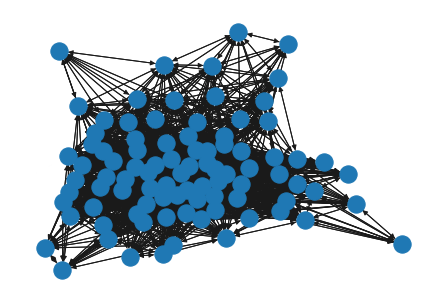

In [291]:
nx.draw(to_networkx(real[0]))

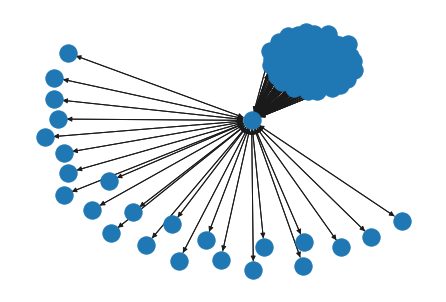

In [292]:
nx.draw(to_networkx(fake[0]))